In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [106]:
name_to_id_df = pd.read_csv('species codes.csv', encoding='unicode_escape')
id_to_name_dict = {}
for _, row in name_to_id_df.iterrows():
    name = "{}-{}".format(row['species_primary_common_name'], row['species_scientific_name']).lower().replace(' ', '')
    id_to_name_dict[row['species_id']] = name

In [107]:
def get_percent_of_positive_observations_for_each_week(state_df, year, species_id, attr):
    species_df = state_df[state_df['Species_id'] == species_id]
    species_df = species_df[species_df['Year'] == year]
    species_df = species_df[species_df[attr] >= 0]
    pcts = []
    for week in range(48):
        species_df_week = species_df[species_df['Week'] == week]
        N = len(species_df_week)
        if N == 0:
            pcts.append(0)
        else:
            species_df_week_observed = species_df_week[species_df_week[attr] > 0]
            pcts.append(len(species_df_week_observed) / N)
    return pcts

In [108]:
def get_scores(state_df, species_id, attr, L=5, M=3, w_1=1, w_2=1, phenophase_start=True):
    pcts = []
    for year in range(2018, 2024):
        pcts += get_percent_of_positive_observations_for_each_week(state_df, year, species_id, attr)

    if phenophase_start:
        scores = []
        stagns = []
        spikes = []
        for week in range(L, len(pcts)-M, 1):
            stagn = (1 / (0.1 + max(pcts[week-L:week+1]) - min(pcts[week-L:week+1])))**2
            spike = max(0, pcts[week + M] - pcts[week])
            spikes.append(spike)
            stagns.append(stagn)
        
        spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
        scores = (w_1 * np.array(stagns) + w_2 * np.array(spikes)) / 2
        spikes = np.array([0 for i in range(L)] + list(spikes) + [0 for i in range(M)])
        stagns = np.array([0 for i in range(L)] + list(stagns) + [0 for i in range(M)])
        scores = np.array([0 for i in range(L)] + list(scores) + [0 for i in range(M)])
        return scores, spikes, stagns
    
    if not phenophase_start:
        scores = []
        stagns = []
        spikes = []
        for week in range(M, len(pcts)-L, 1):
            stagn = (1 / (0.1 + max(pcts[week:week+L+1]) - min(pcts[week:week+L+1])))**2
            spike = max(0, pcts[week - M] - pcts[week])
            spikes.append(spike)
            stagns.append(stagn)
        spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
        scores = (w_1 * np.array(stagns) + w_2 * np.array(spikes)) / 2
        spikes = np.array([0 for i in range(L)] + list(spikes) + [0 for i in range(M)])
        stagns = np.array([0 for i in range(L)] + list(stagns) + [0 for i in range(M)])
        scores = np.array([0 for i in range(L)] + list(scores) + [0 for i in range(M)])
        return scores, spikes, stagns

In [112]:
def plot_score_and_pcts(species_id, attr, L=5, M=3, w_1=1, w_2=1):
    state_df = pd.read_csv('all data/citizen/kerala.csv')
    pcts = []
    for year in range(2018, 2024):
        pcts += get_percent_of_positive_observations_for_each_week(state_df, year, species_id, attr)
    
    scores_start, spikes_start, stagns_start = get_scores(state_df, species_id, attr, L=L, M=M, w_1=w_1, w_2=w_2,
                                                         phenophase_start=True)
    scores_end, spikes_end, stagns_end = get_scores(state_df, species_id, attr, L=L, M=M, w_1=w_1, w_2=w_2,
                                                         phenophase_start=False)
    
    start_means = []
    end_means = []
    
    for i in range(0,len(scores_start), 48):
        max_start_score_idx = i+24 + np.argmax(scores_start[i+24:i+48])
        max_end_score_idx = i + np.argmax(scores_end[i:i+24])
        start_scores_for_year = scores_start[max(0, max_start_score_idx-24):min(len(scores_start), max_start_score_idx+24)].copy()
        end_scores_for_year = scores_end[max(0, max_end_score_idx-24):min(len(scores_start), max_end_score_idx+24)].copy()
        #print(f'end_scores for year is {end_scores_for_year}')
        start_scores_for_year /= np.sum(start_scores_for_year)
        end_scores_for_year /= np.sum(end_scores_for_year)
        
        start_means.append(np.dot(start_scores_for_year, range(max(0, max_start_score_idx-24), min(len(scores_start), max_start_score_idx+24))))
        end_means.append(np.dot(end_scores_for_year, range(max(0, max_end_score_idx-24), min(len(scores_start), max_end_score_idx+24))))

    fig, ax = plt.subplots()
    ax.plot(range(len(pcts)), pcts, label=f'percent of observations observing {attr}')
    for ex in start_means:
        ax.axvline(x=ex, color='r', linestyle='--', linewidth=2, label='start transition times')
    for ex in end_means:
        ax.axvline(x=ex, color='g', linestyle='--', linewidth=2, label='end transition times')
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='lower left')
    ax.set(xlabel='week', ylabel='percent of observations')
    twin = ax.twinx()
    twin.bar(range(len(pcts)), scores_start, label='unnormalized week score (for transition start)', alpha=0.25, color='red')
    twin.set(ylabel='score')
    plt.title(f"{id_to_name_dict[species_id]}, {attr} probs / pcts, L={L}, M={M}, w_1={w_1}, w_2={w_2}")
    twin.legend(loc='upper right')
    plt.show()

    fig, ax = plt.subplots()
    ax.plot(range(len(pcts)), pcts, label=f'percent of observations observing {attr}')
    for ex in start_means:
        ax.axvline(x=ex, color='r', linestyle='--', linewidth=2, label='start transition times')
    for ex in end_means:
        ax.axvline(x=ex, color='g', linestyle='--', linewidth=2, label='end transition times')
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='lower left')
    ax.set(xlabel='week', ylabel='percent of observations')
    twin = ax.twinx()
    twin.bar(range(len(pcts)), scores_end, label='unnormalized week score (for transition end)', alpha=0.25, color='green')
    twin.set(ylabel='score')
    plt.title(f"{id_to_name_dict[species_id]}, {attr} probs / pcts, L={L}, M={M}, w_1={w_1}, w_2={w_2}")
    twin.legend(loc='upper right')
    plt.show()
    
    # for idx, year in enumerate(list(range(2018, 2024))):
    #     fig, ax = plt.subplots()
    #     ax.plot(range(48), pcts[48*idx:48*idx+48], label=f'percent of observations of attribute {attr}')
    #     ax.axvline(x=start_means[idx] % 48, color='r', linestyle='--', linewidth=2, label='start mean transition time')
    #     ax.axvline(x=end_means[idx] % 48, color='g', linestyle='--', linewidth=2, label='end transition time')
    #     ax.legend(loc = 'lower left')
    #     ax.set(xlabel='week', ylabel='percent of observations')
    #     twin = ax.twinx()
    #     scores_for_year = scores_start[48*idx:48*idx+48].copy()
    #     probs_for_year = scores_for_year / np.sum(scores_for_year)
    #     #print(probs_for_year)
    #     twin.bar(range(48), probs_for_year, label='probability of week being a transition week', alpha=0.25)
    #     twin.legend(loc='upper right')
    #     twin.set(ylabel='probability')
    #     plt.title(f"Average transition time for {id_to_name_dict[species_id]} {attr} in Kerala, {year}, L={L}, M={M}, w_1={w_1}, w_2={w_2}")

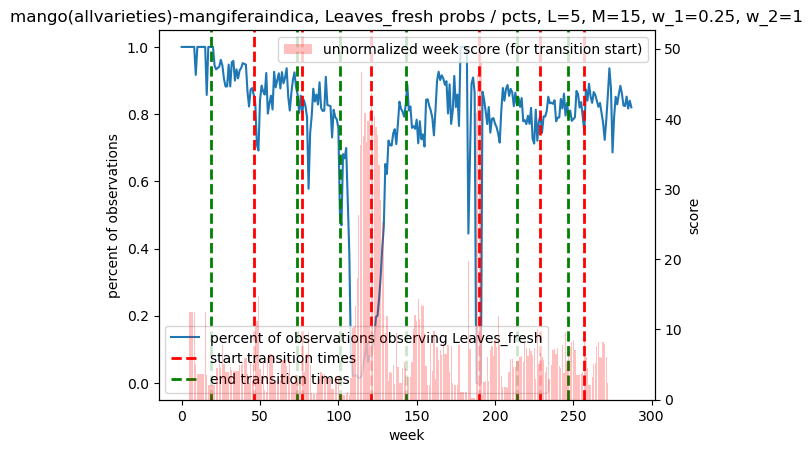

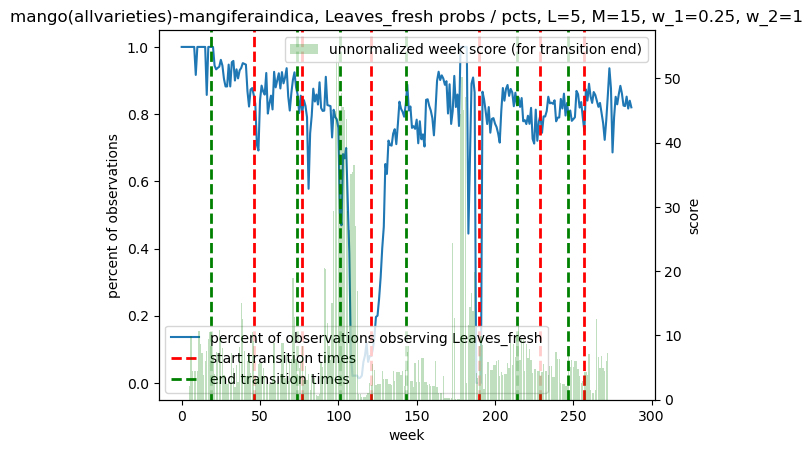

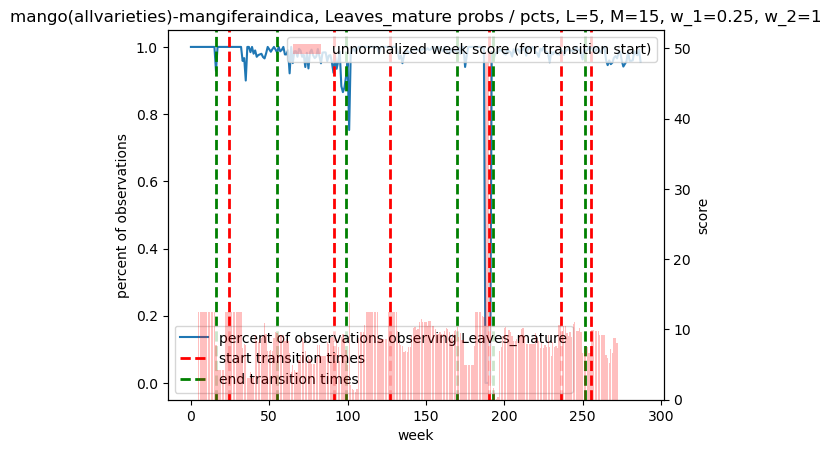

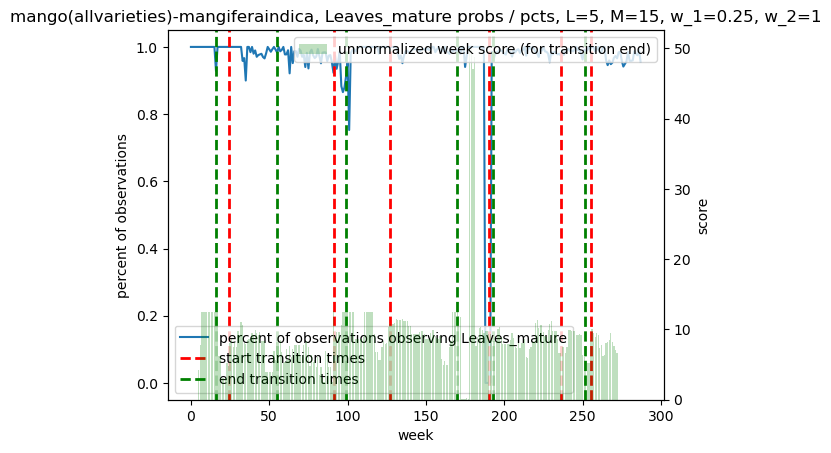

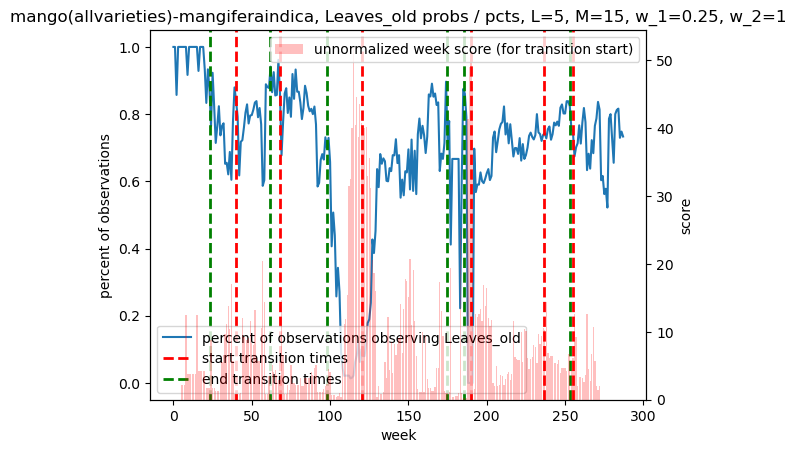

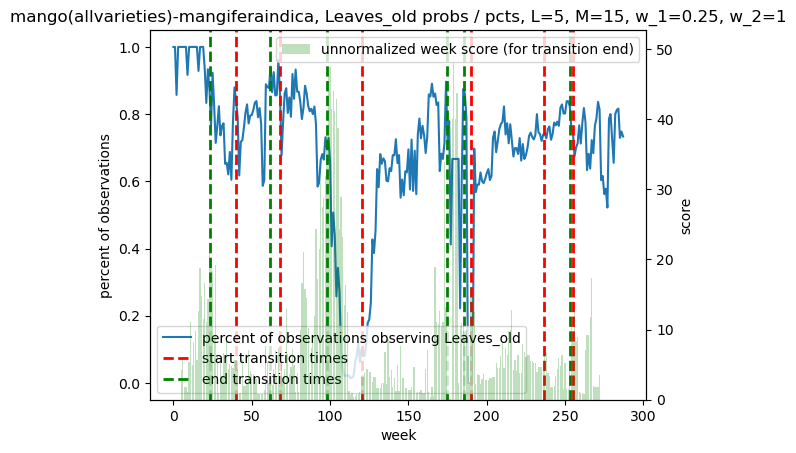

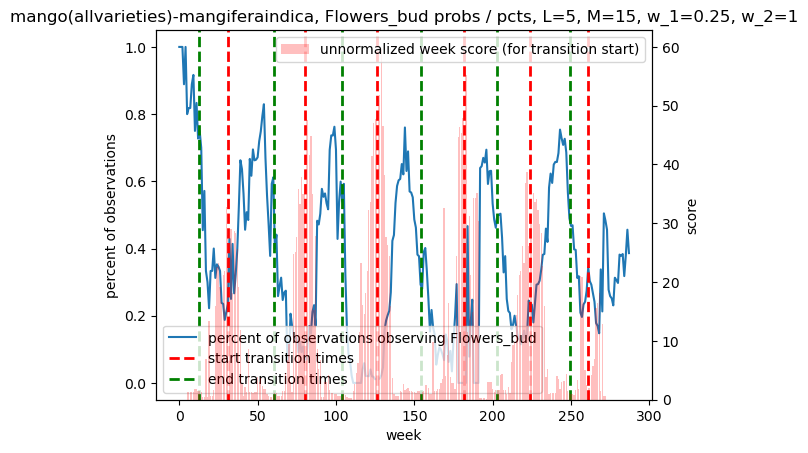

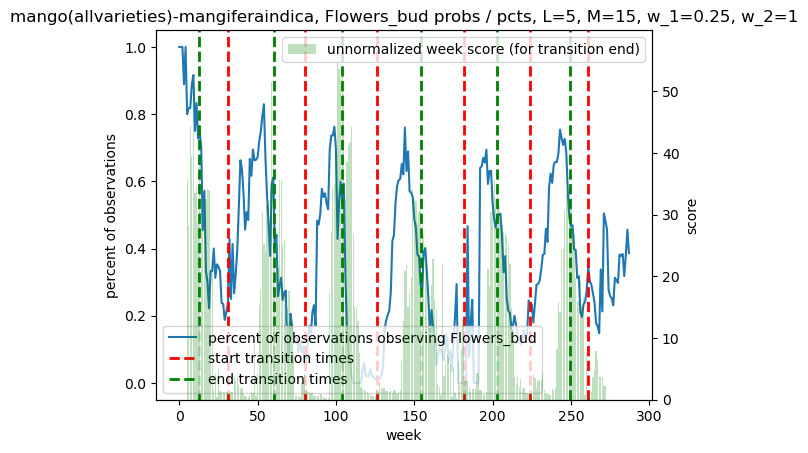

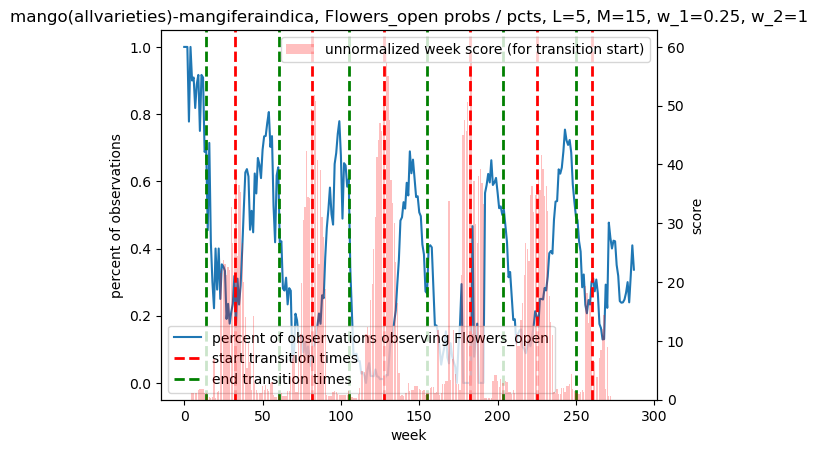

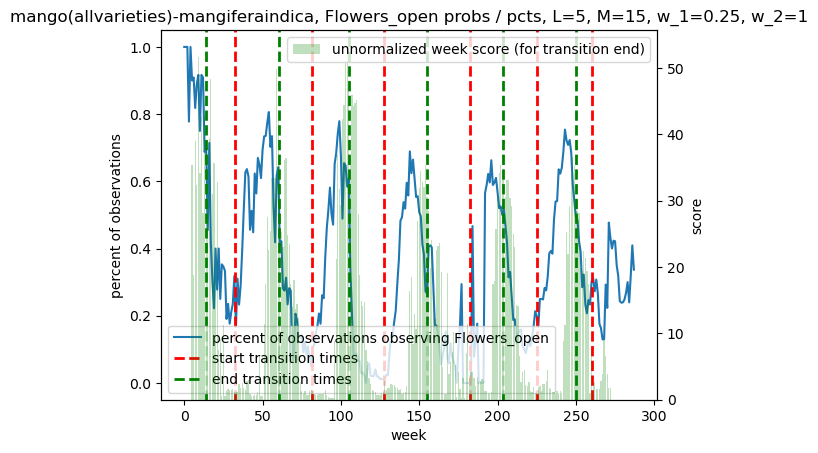

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


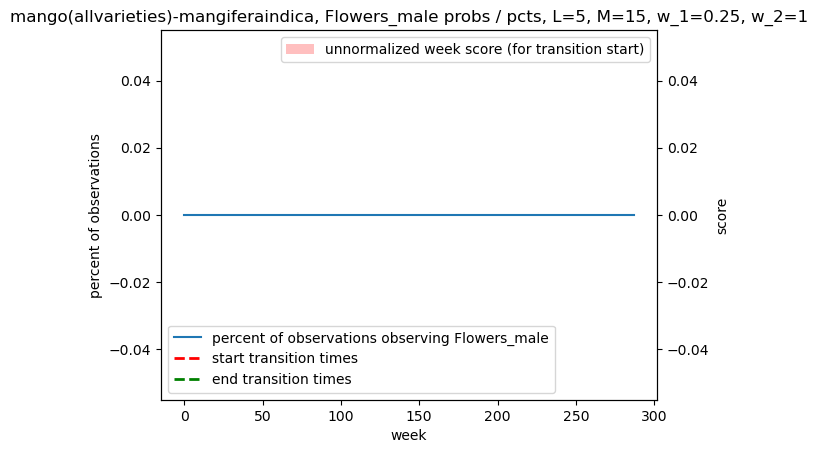

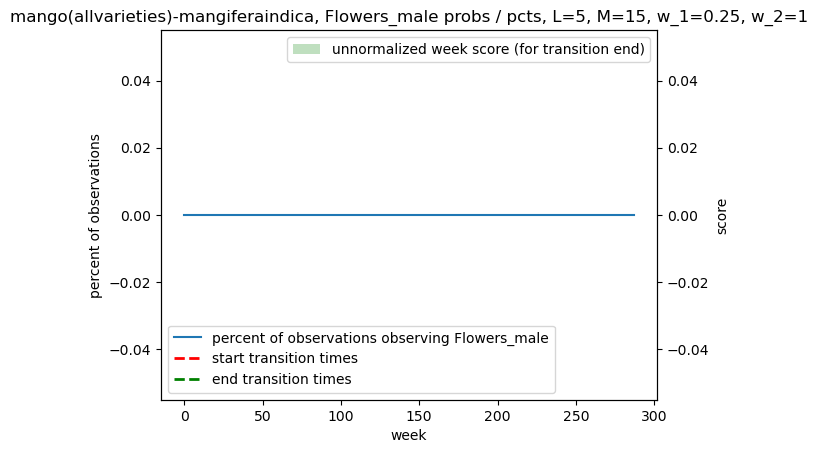

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


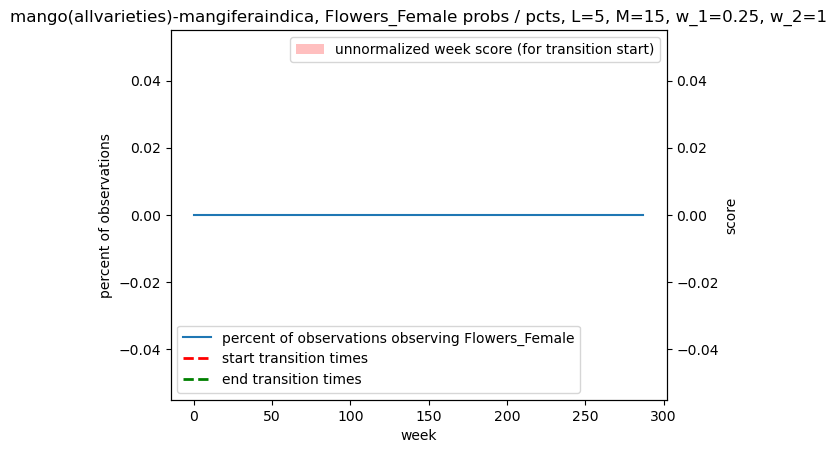

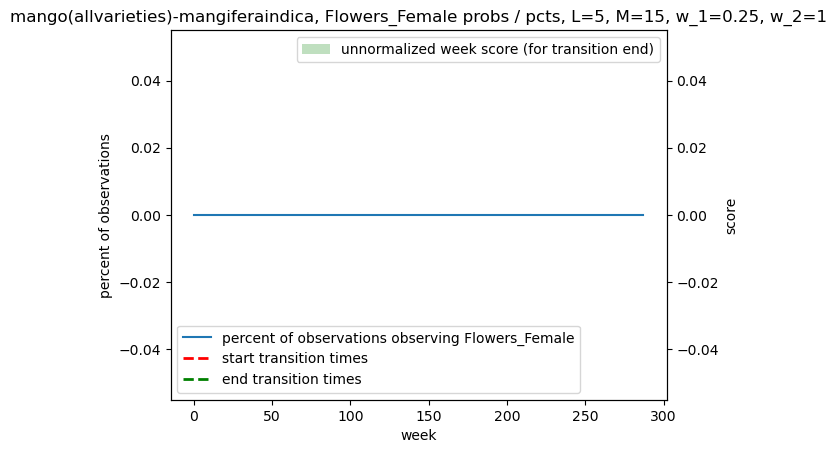

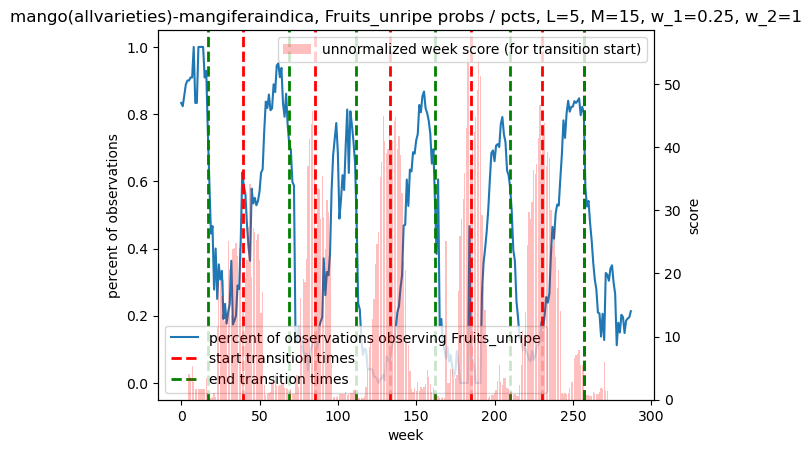

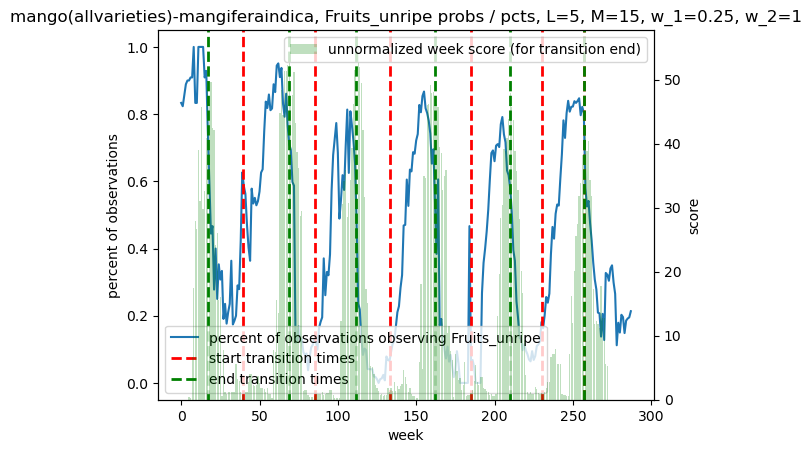

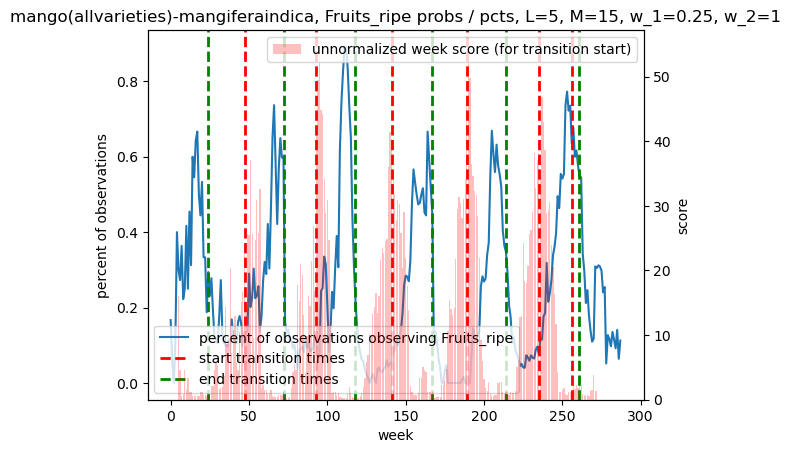

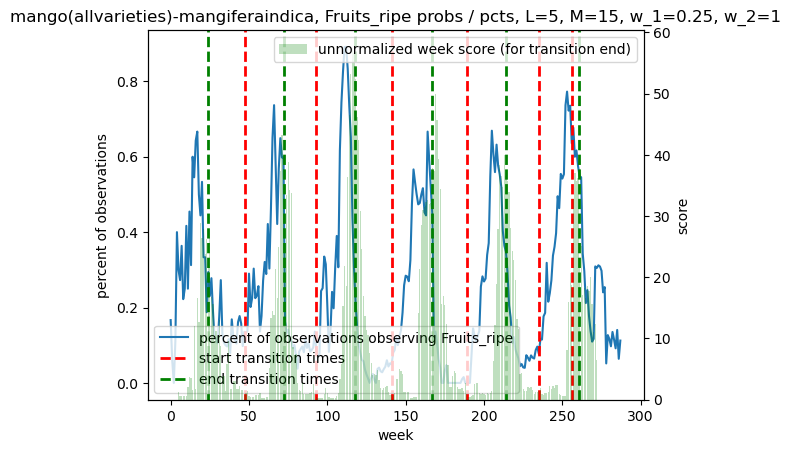

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


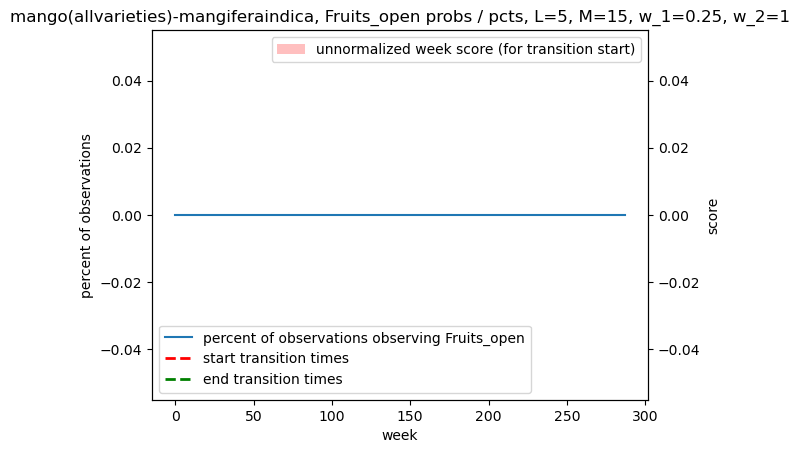

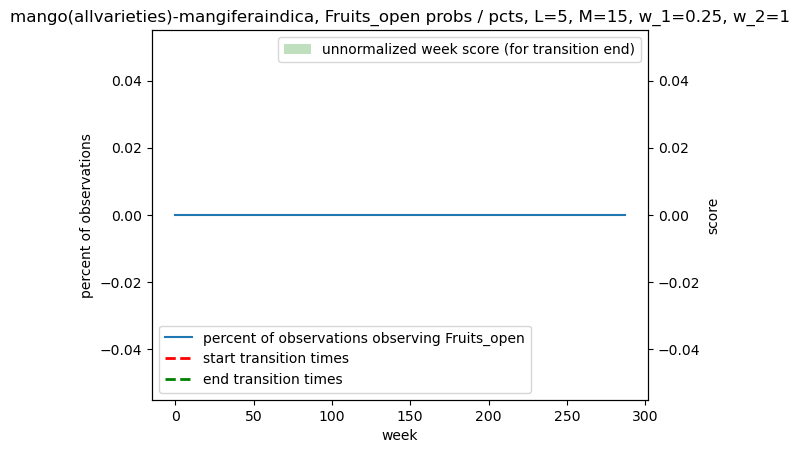

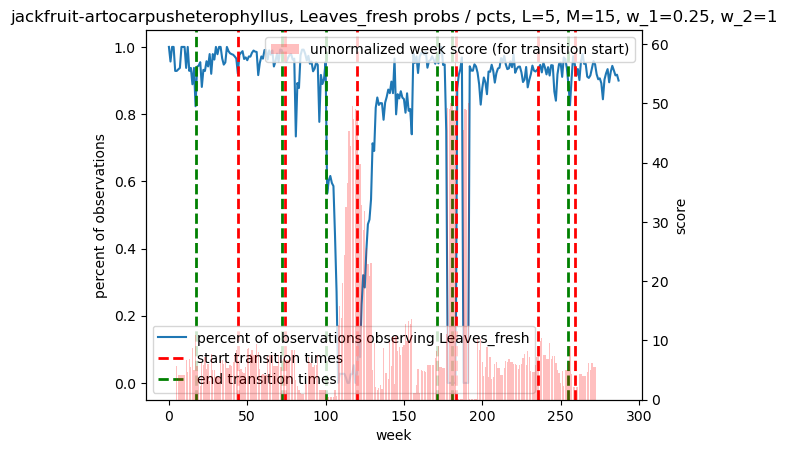

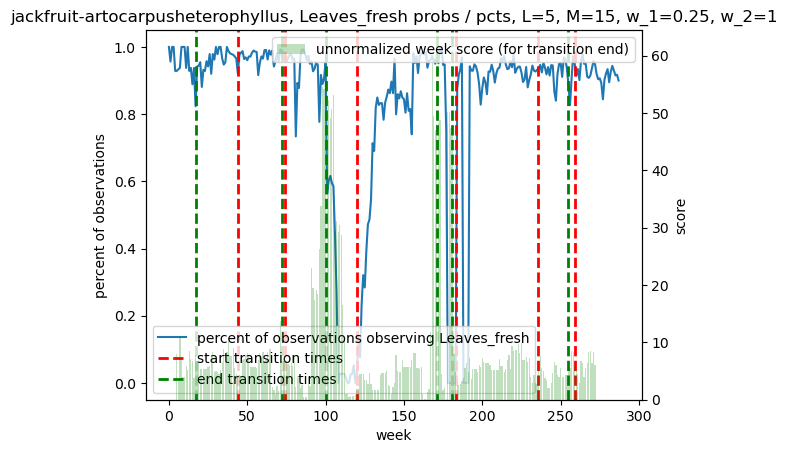

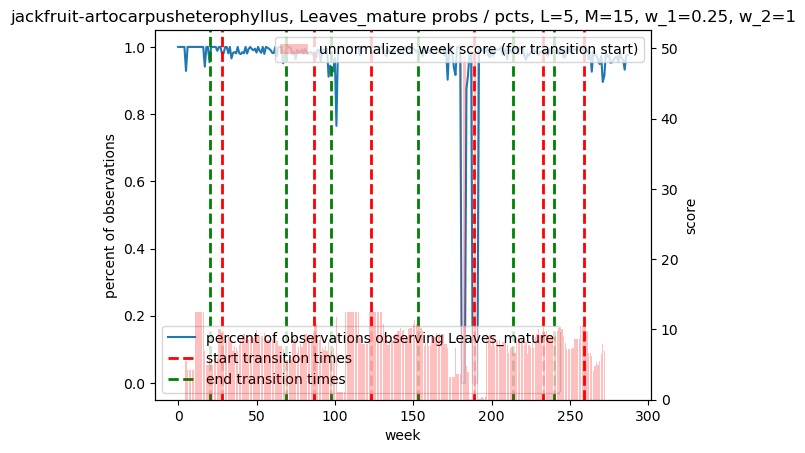

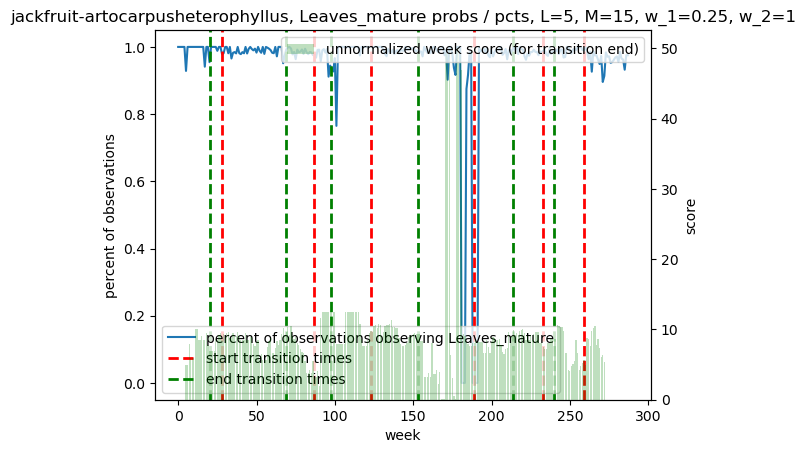

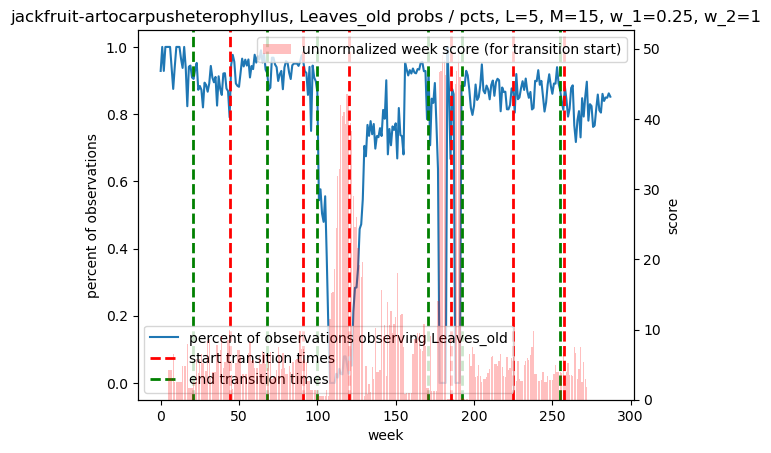

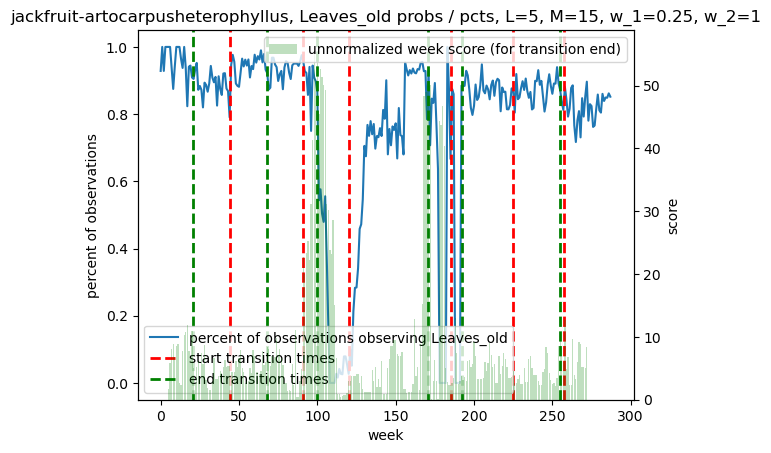

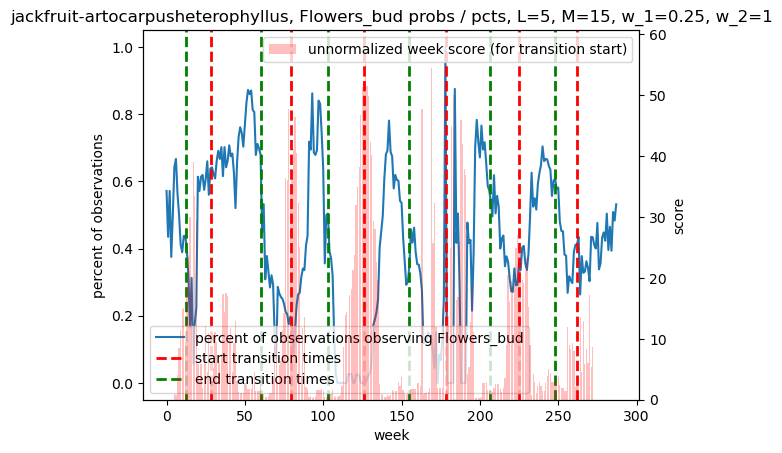

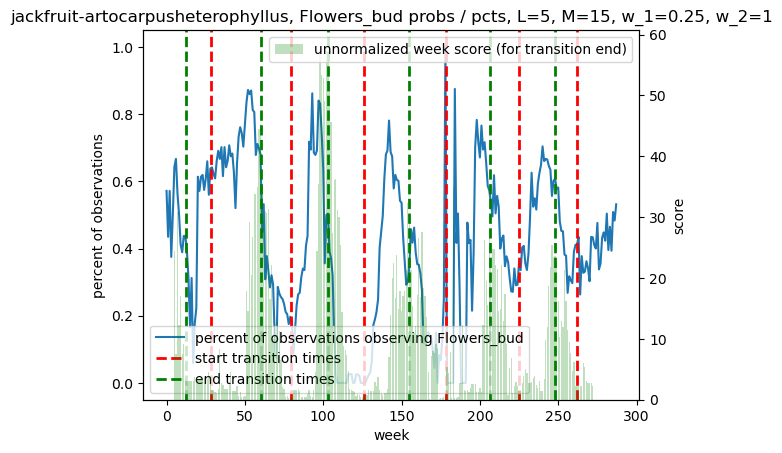

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


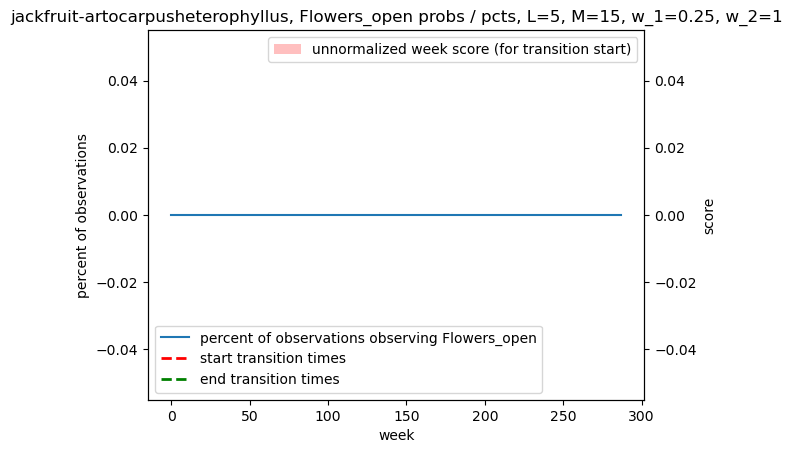

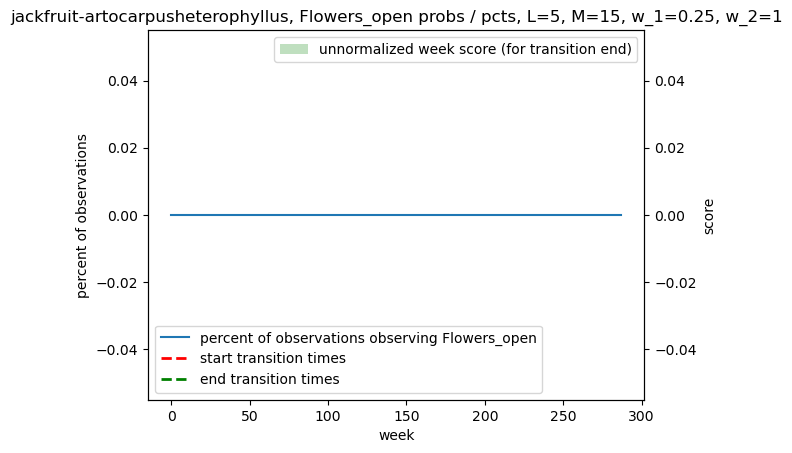

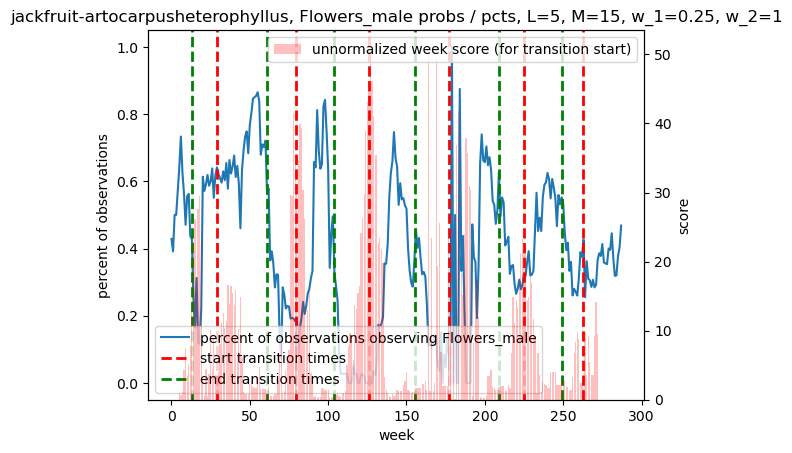

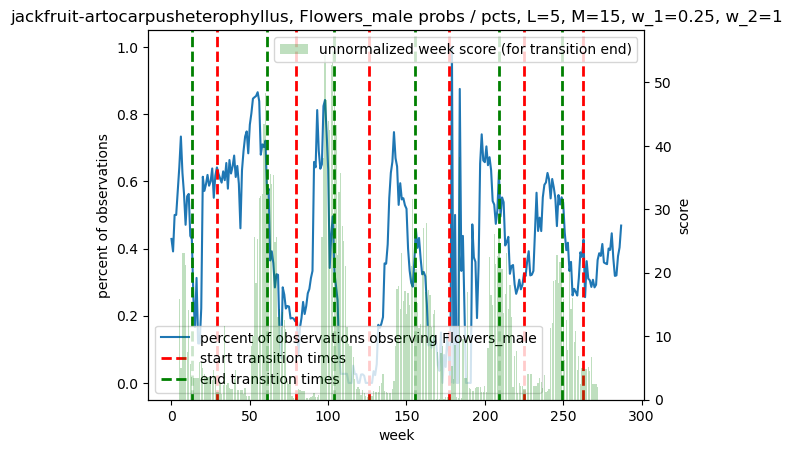

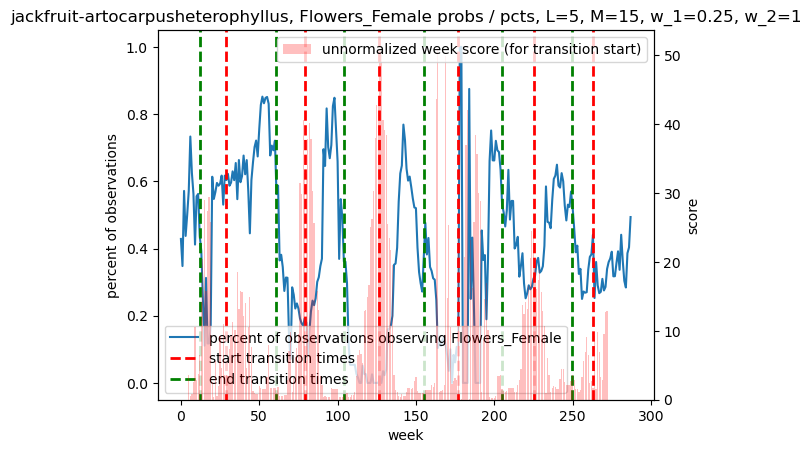

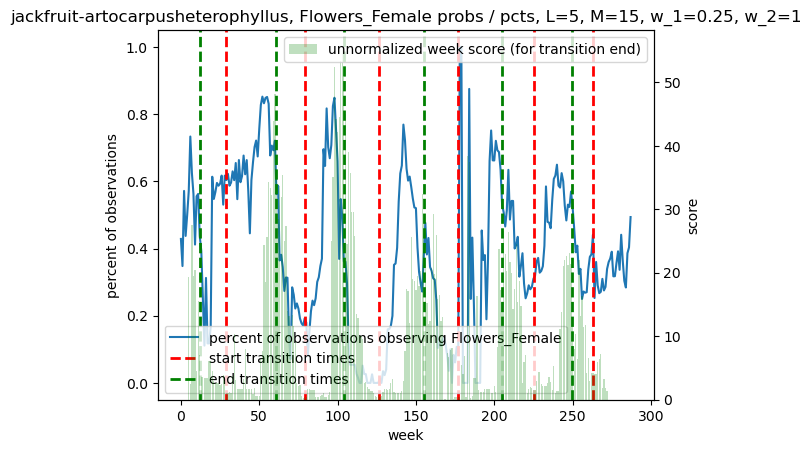

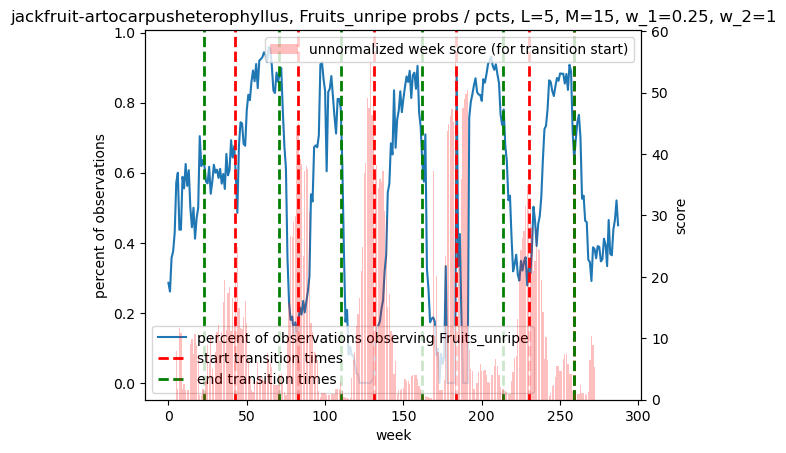

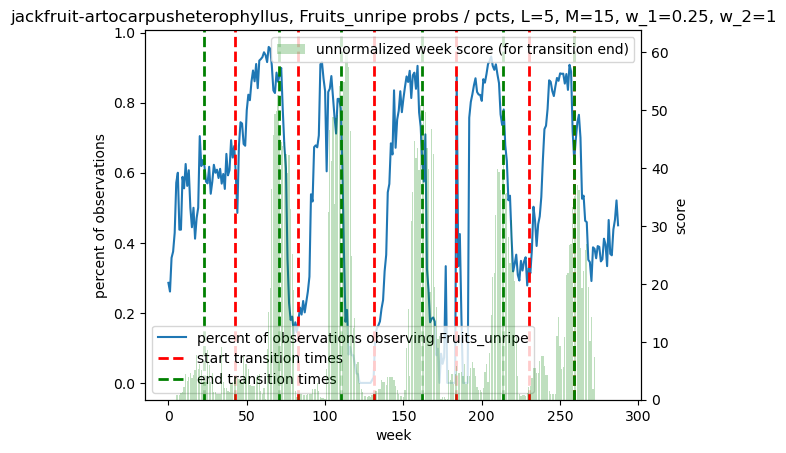

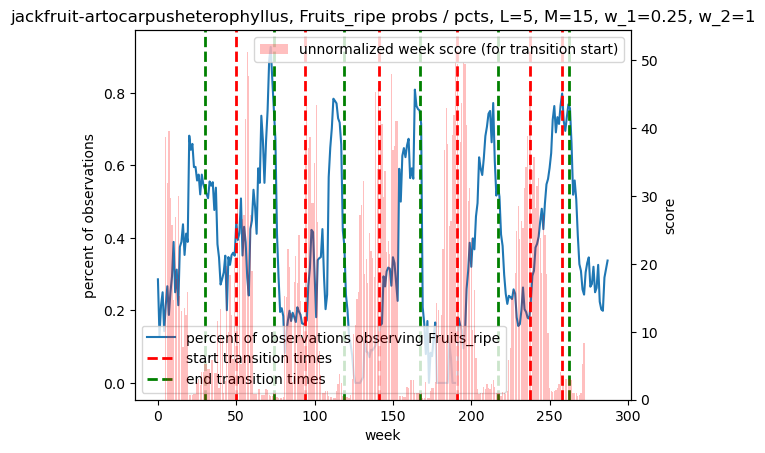

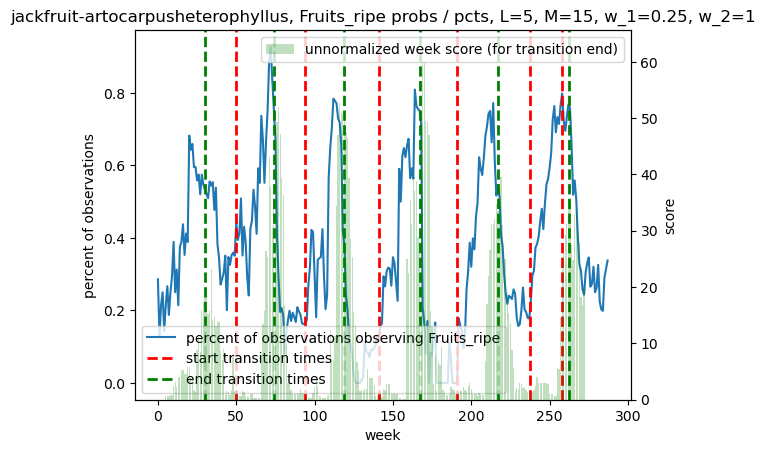

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


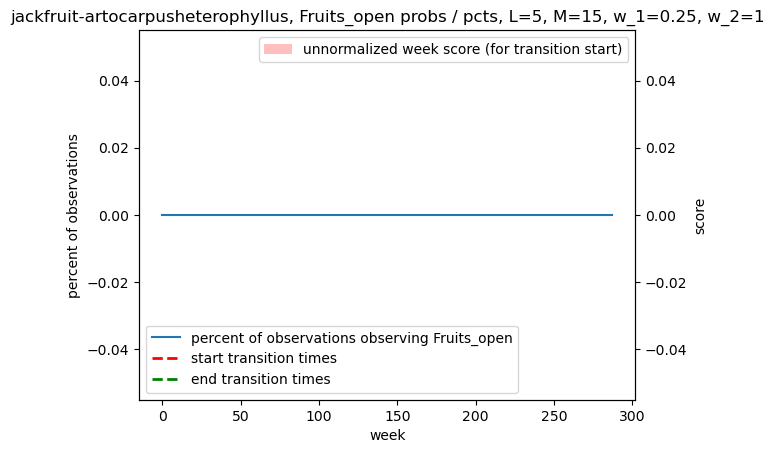

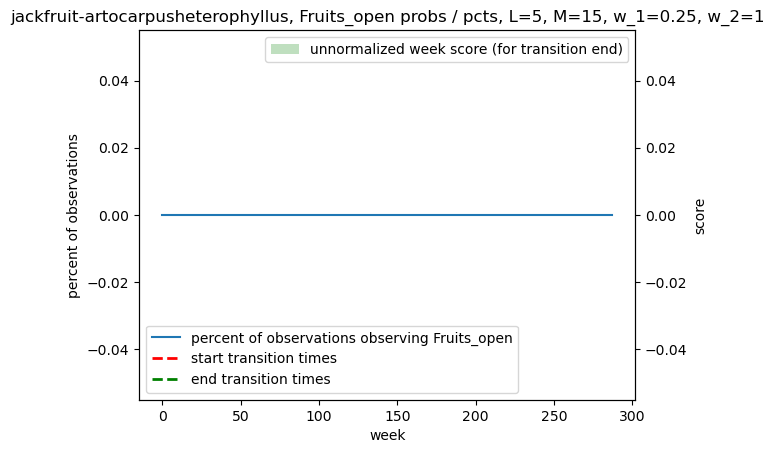

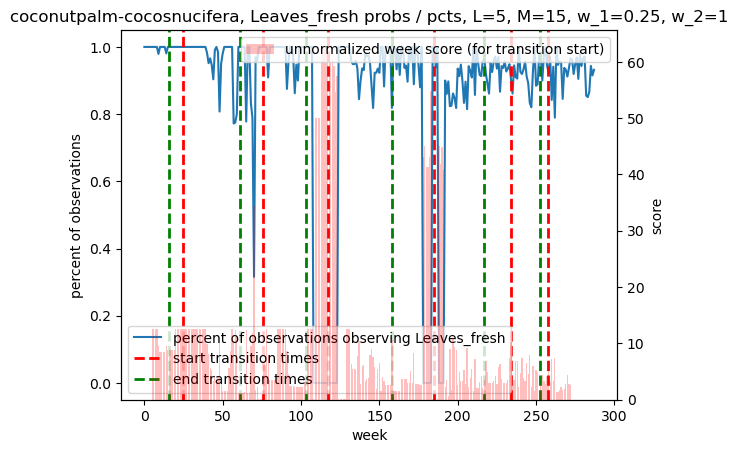

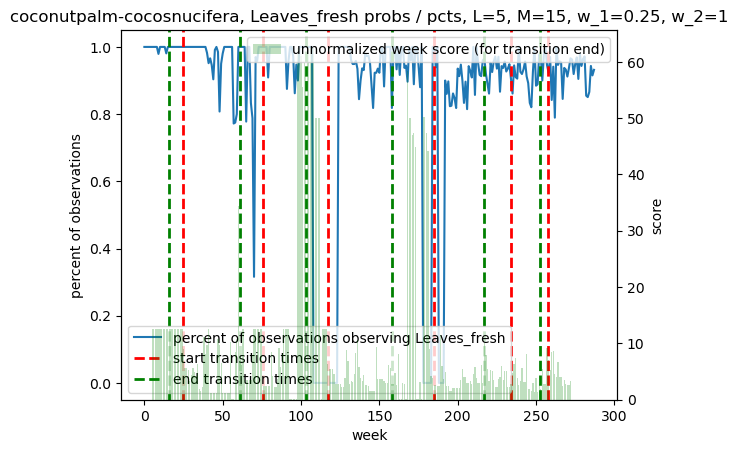

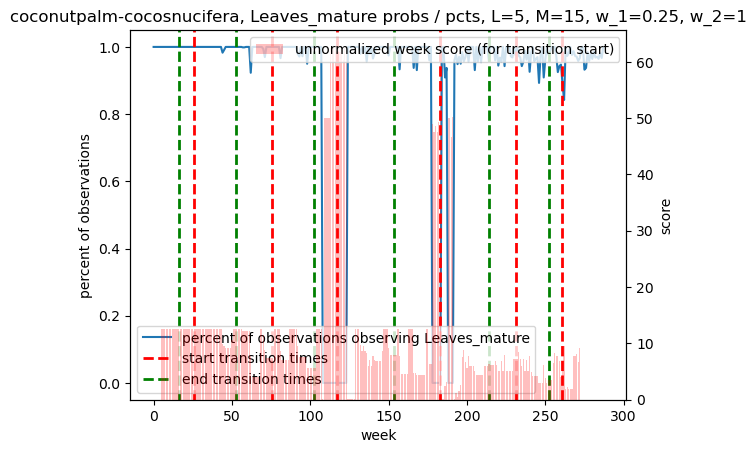

...

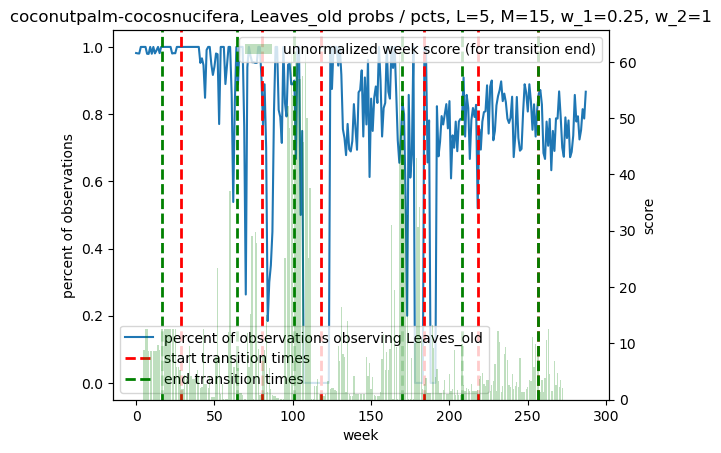

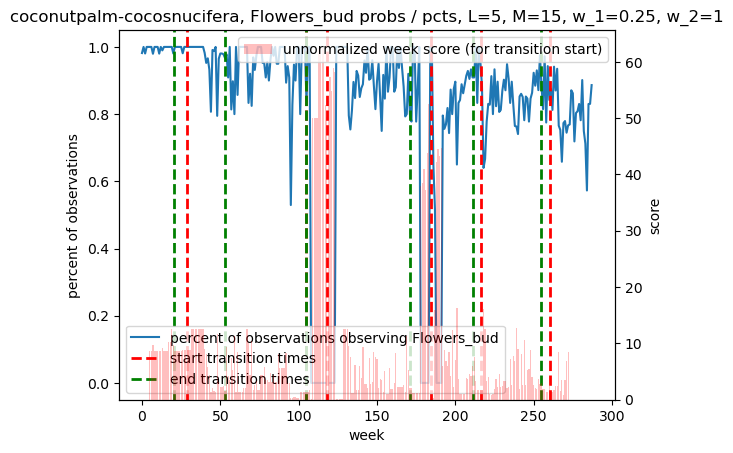

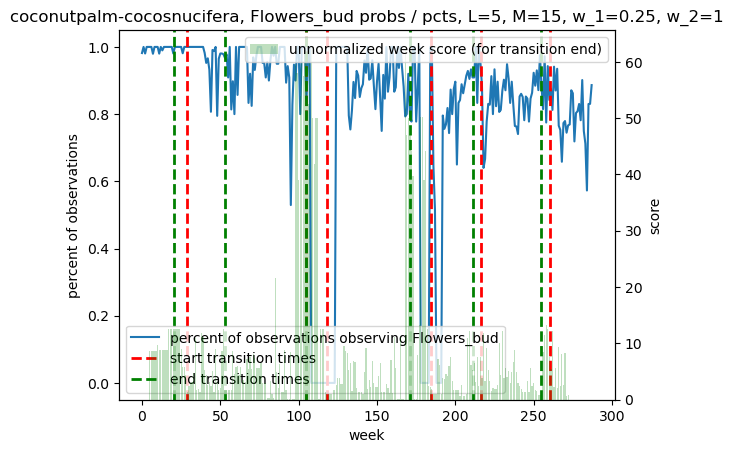

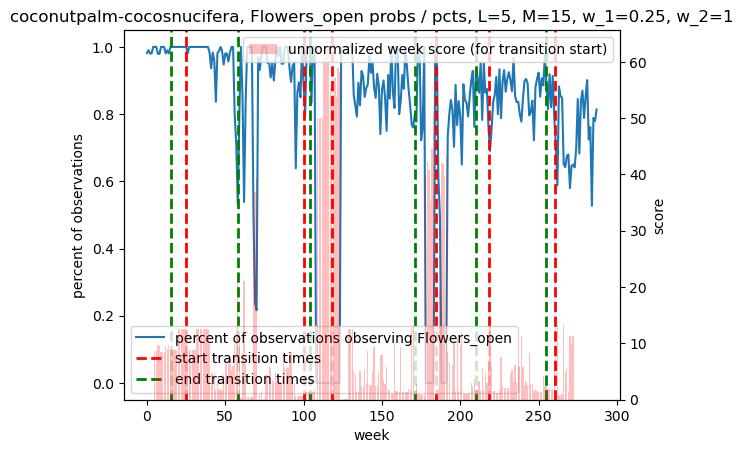

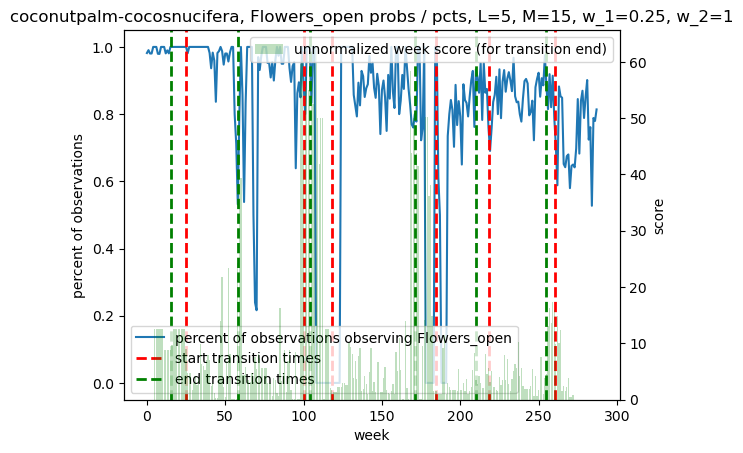

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


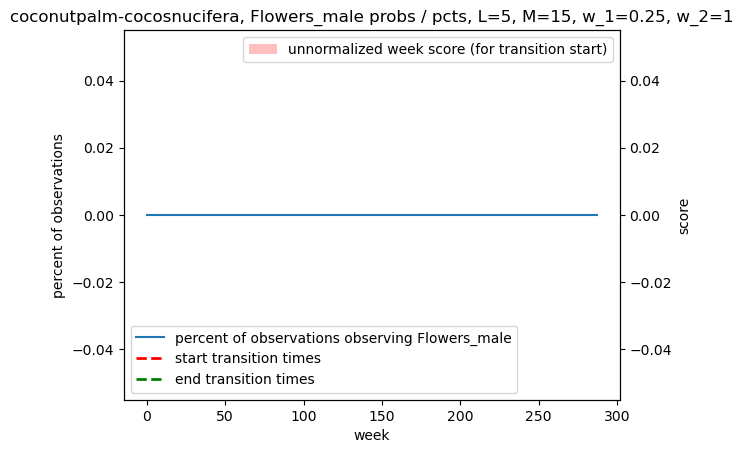

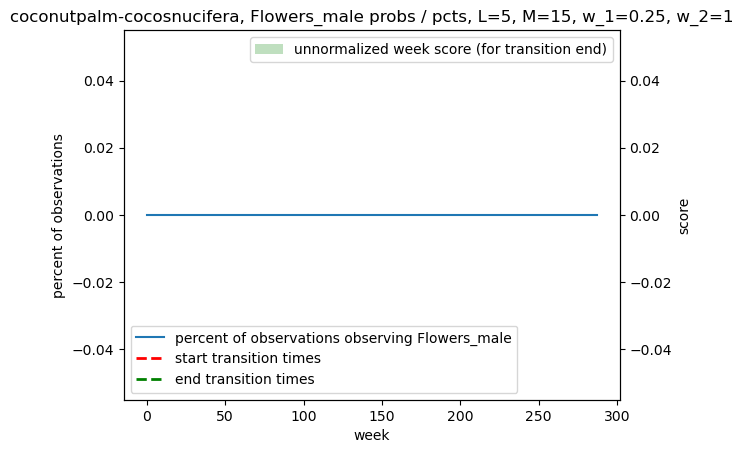

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


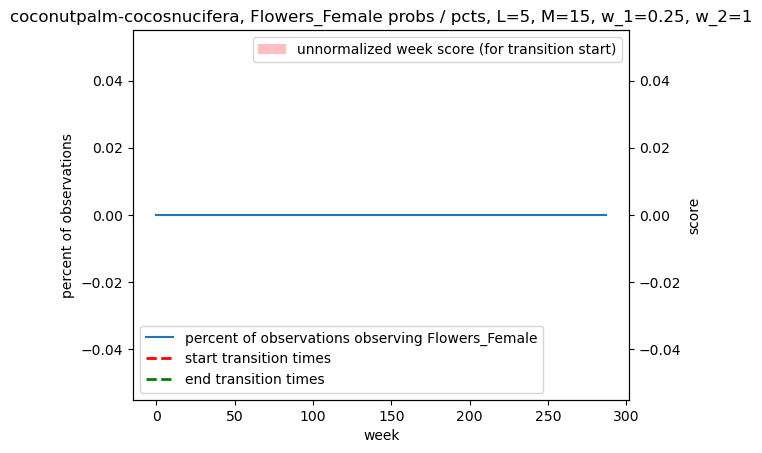

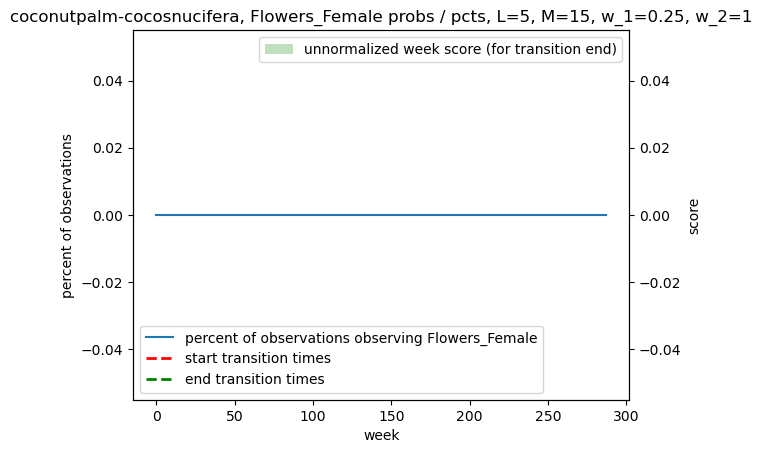

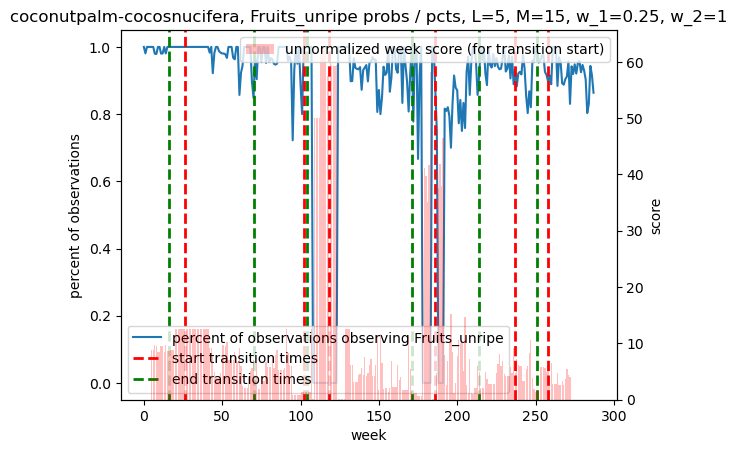

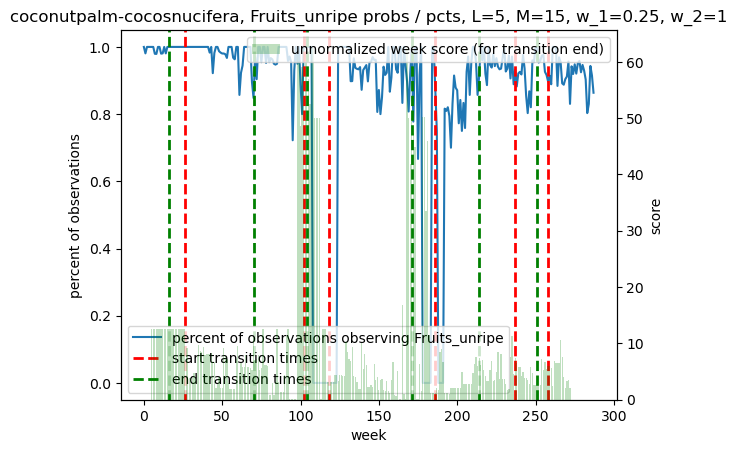

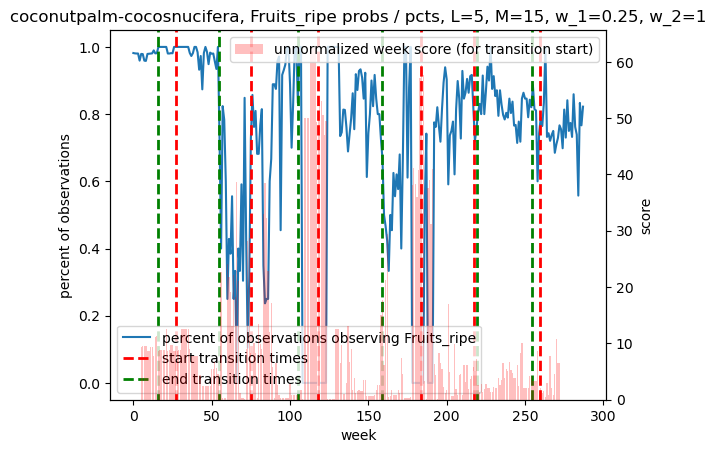

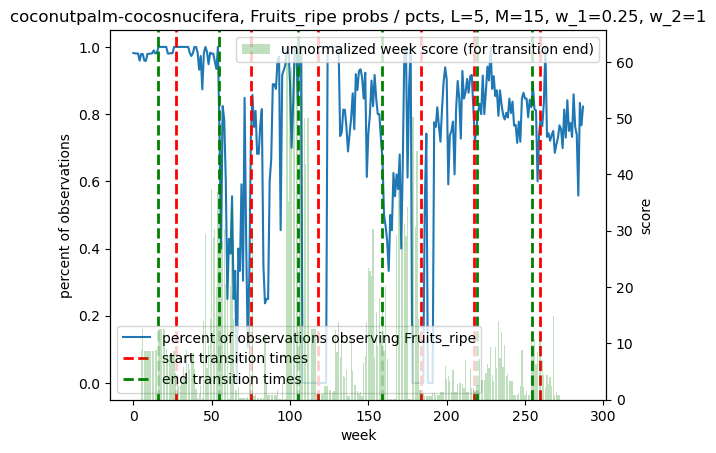

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


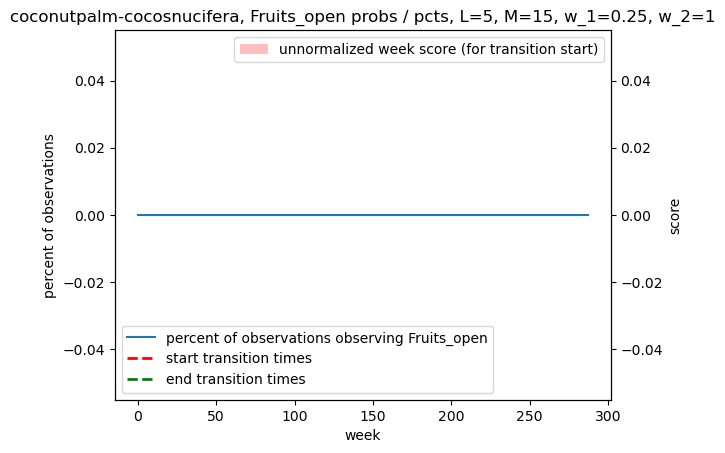

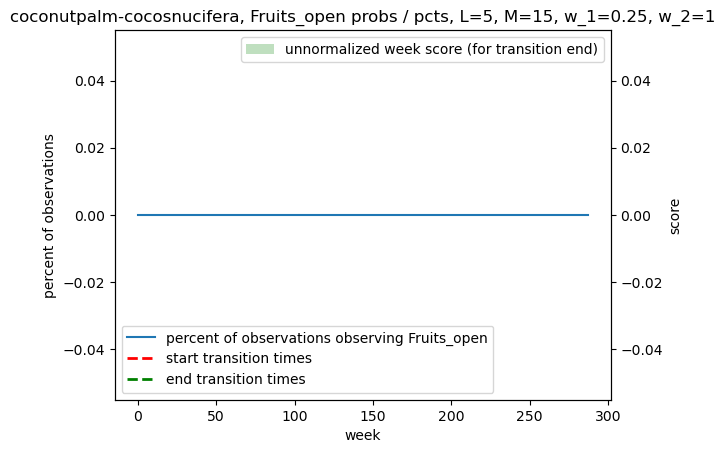

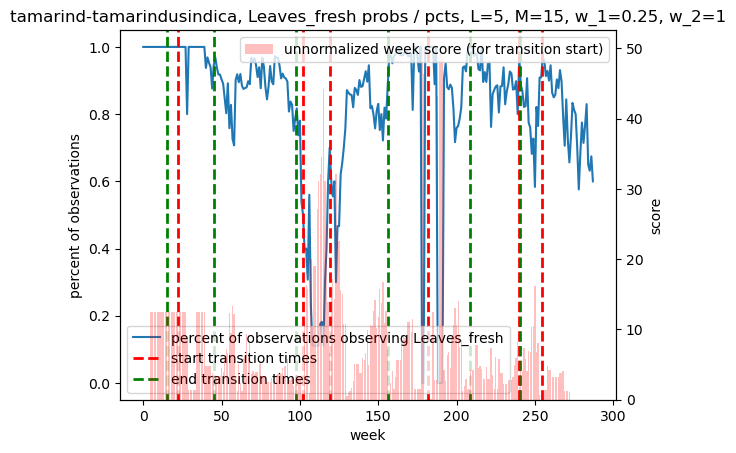

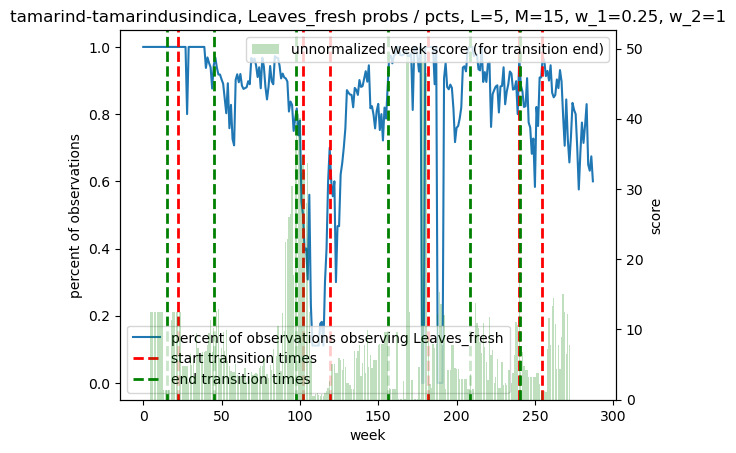

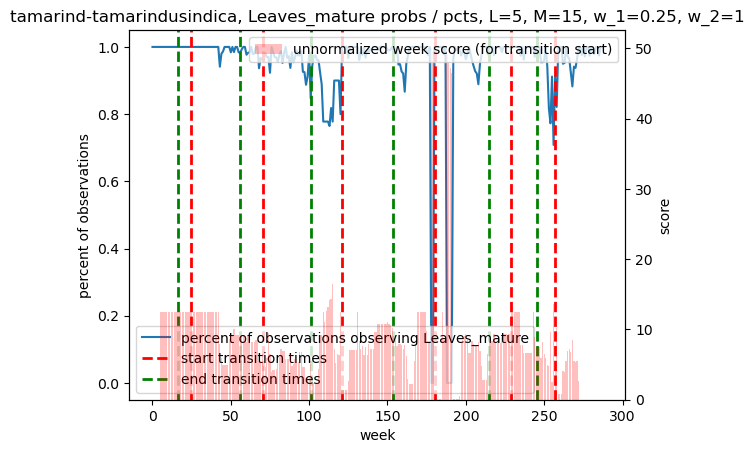

...

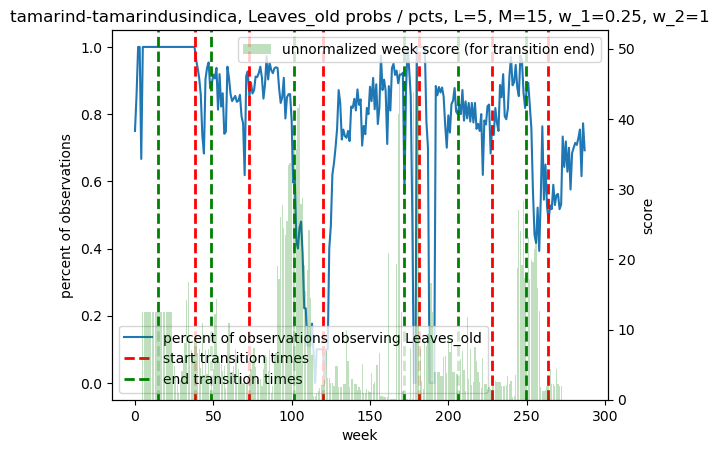

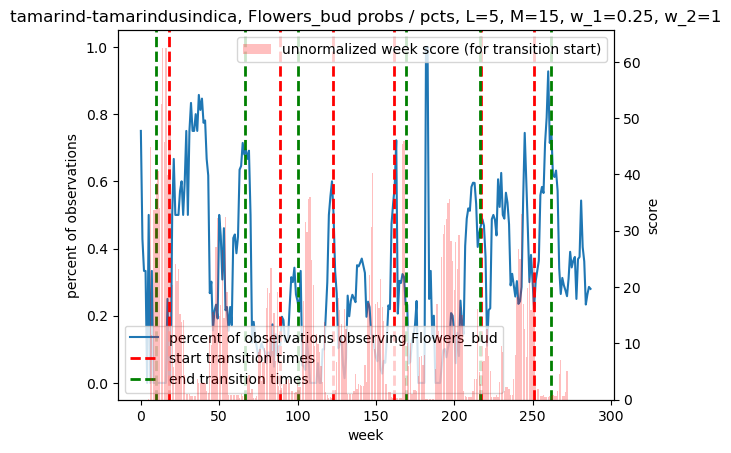

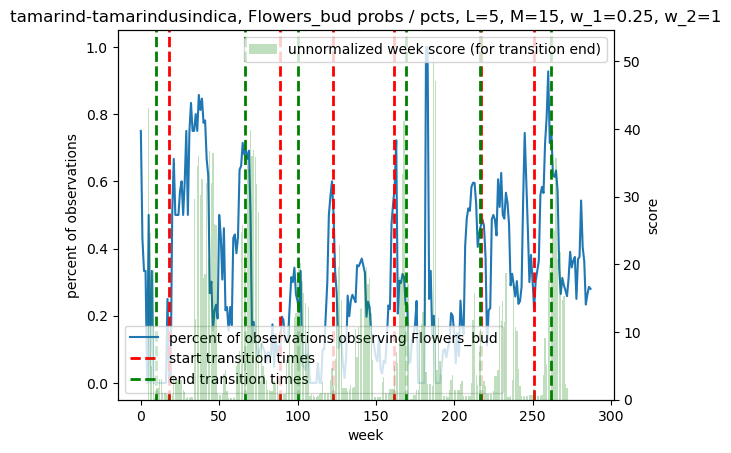

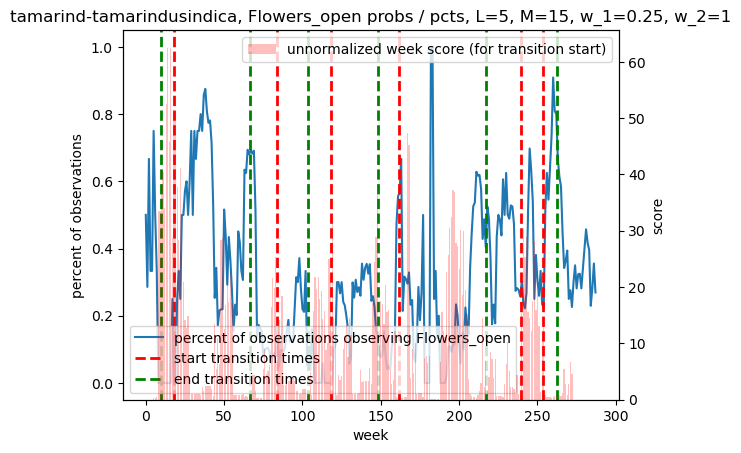

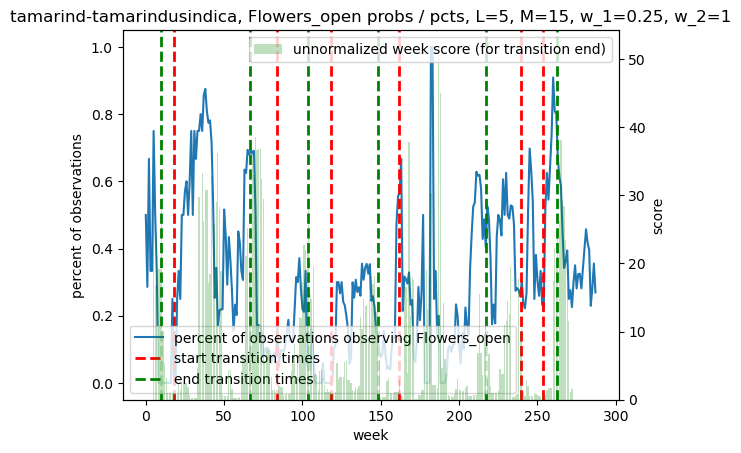

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


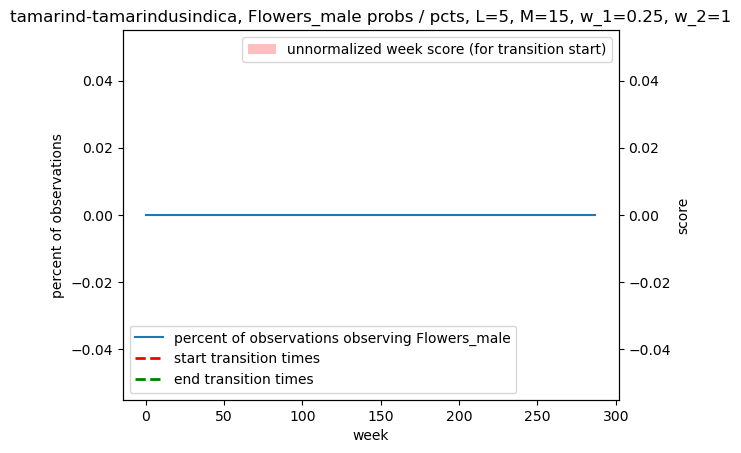

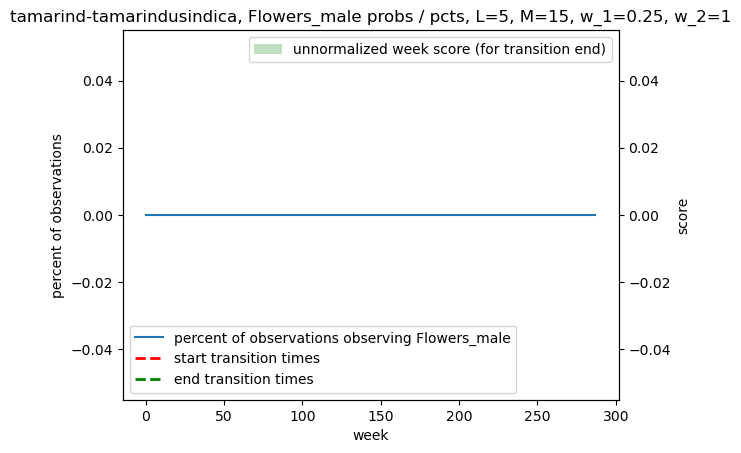

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


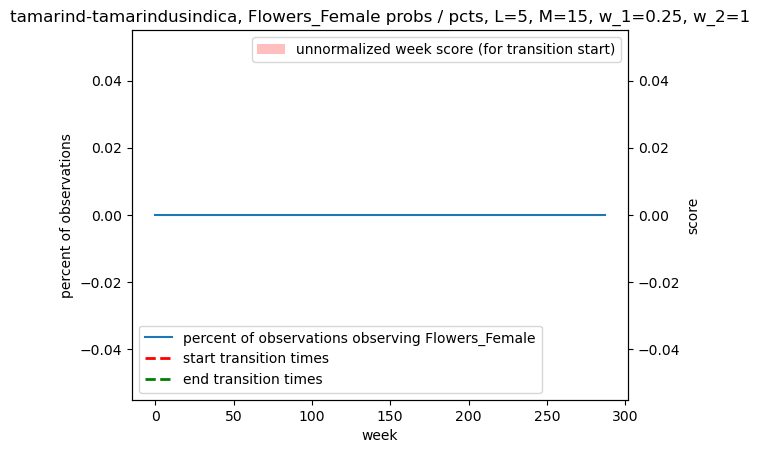

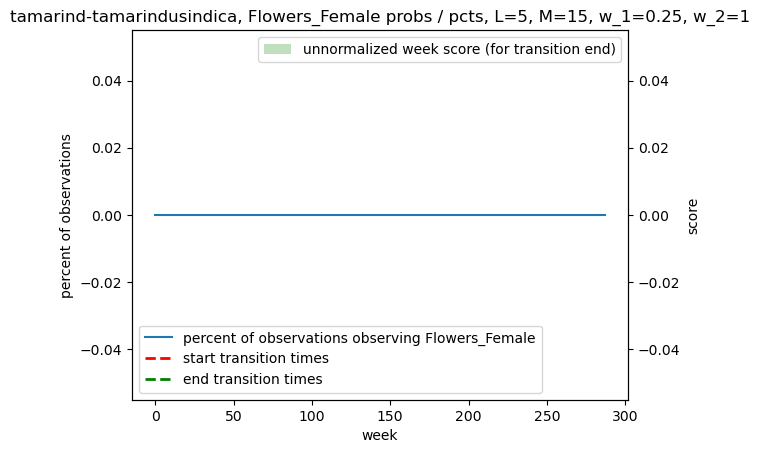

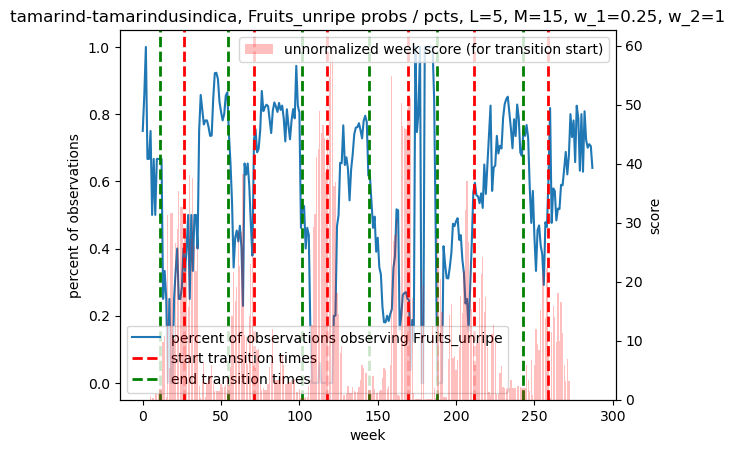

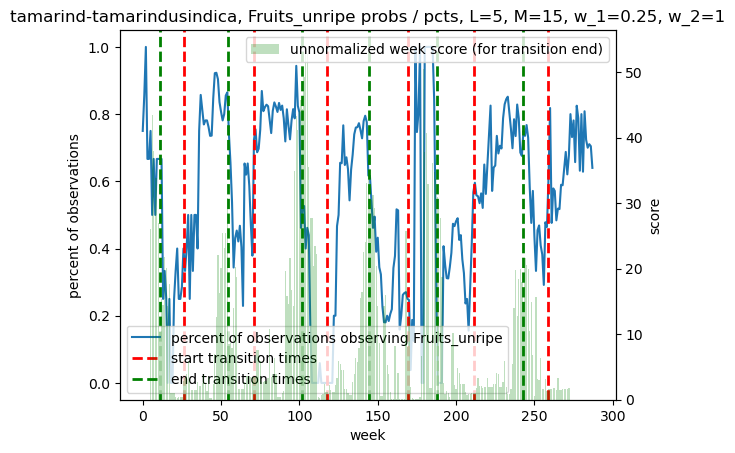

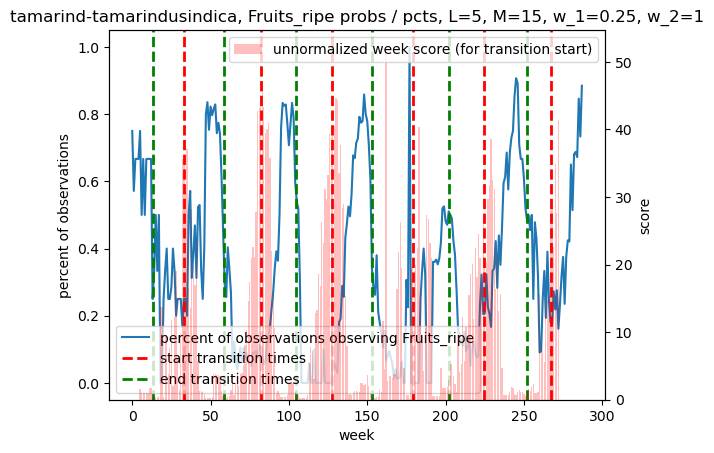

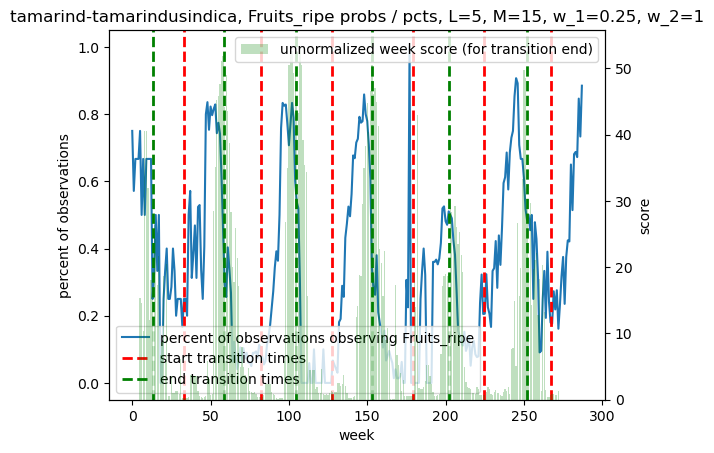

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


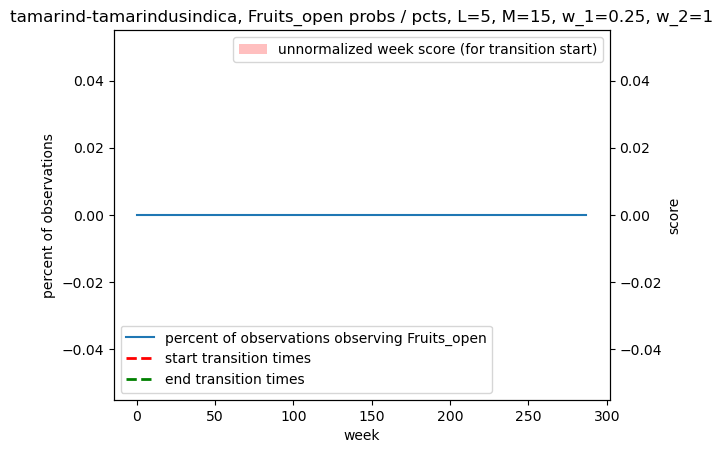

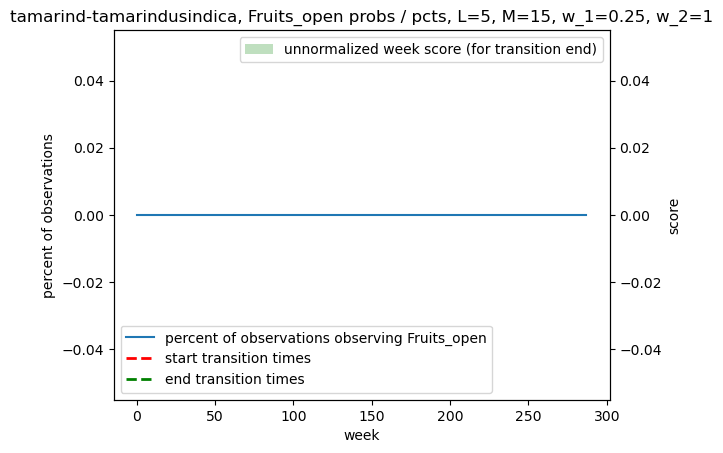

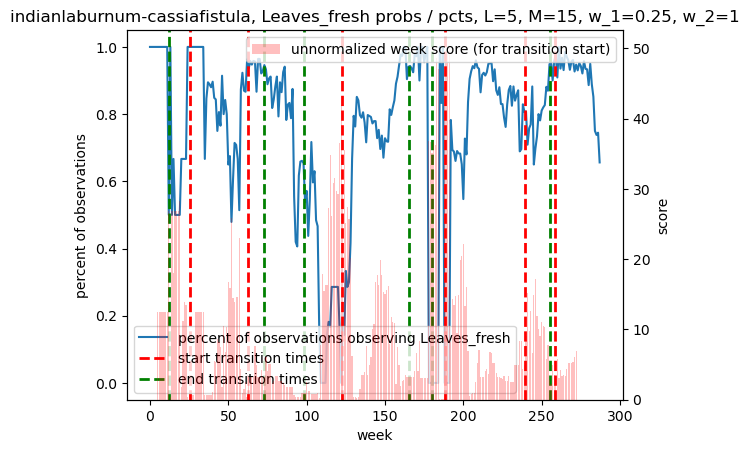

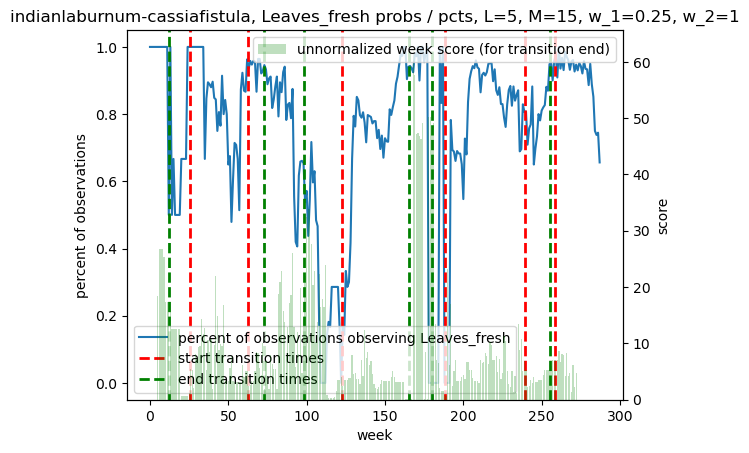

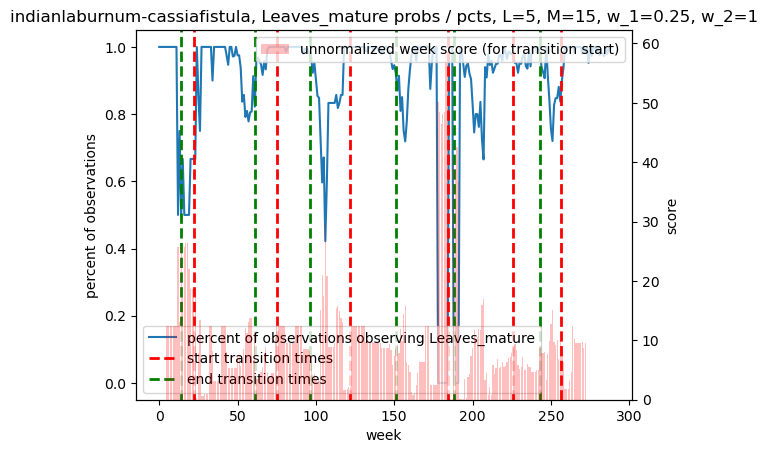

...

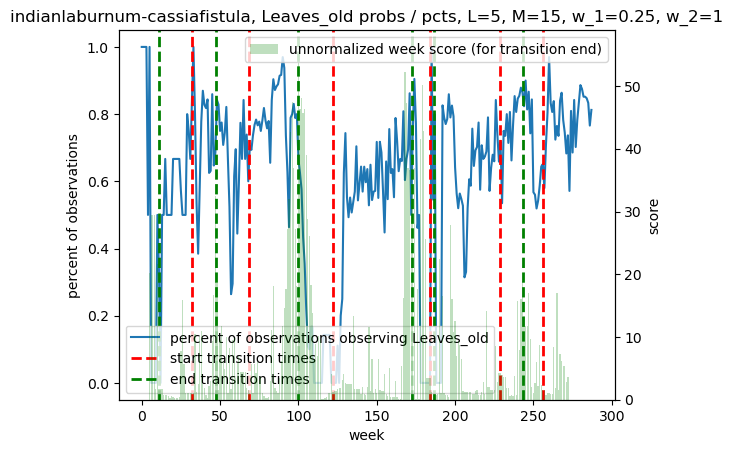

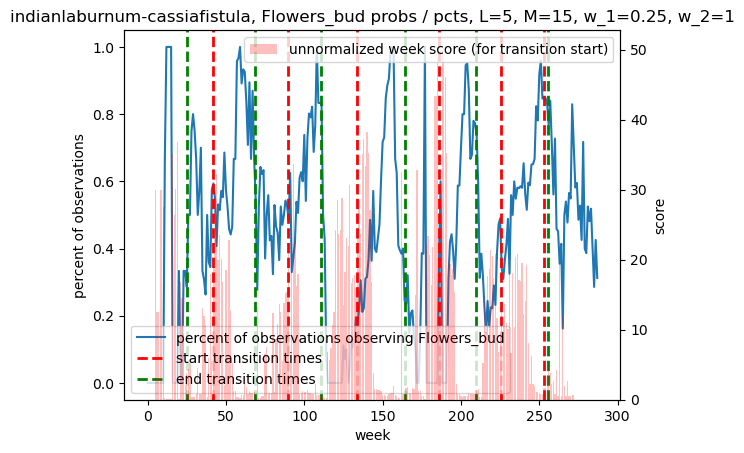

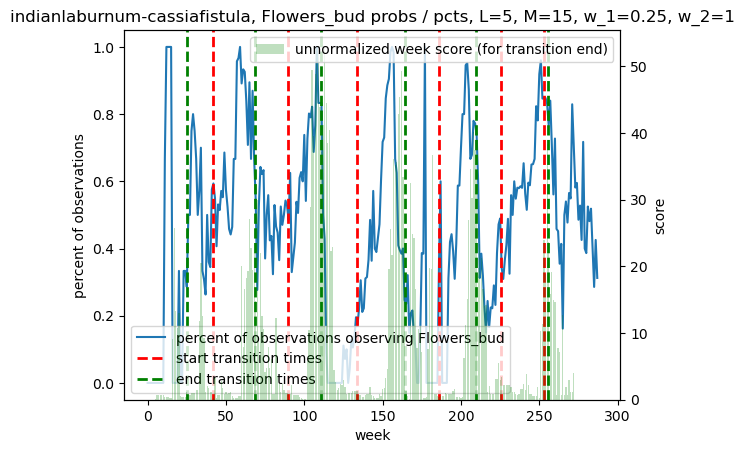

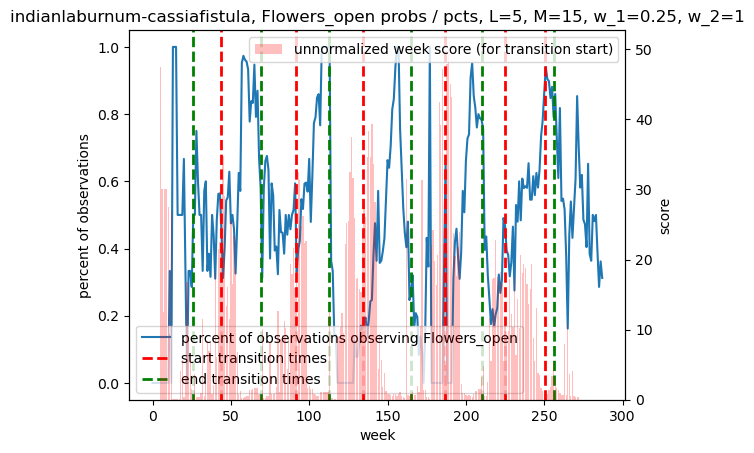

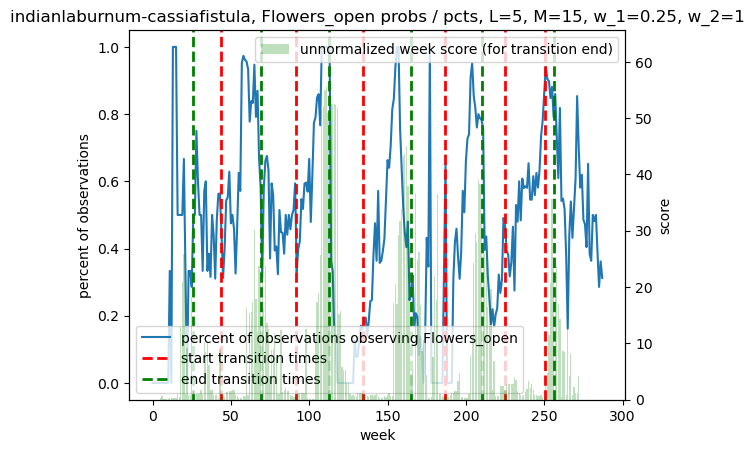

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


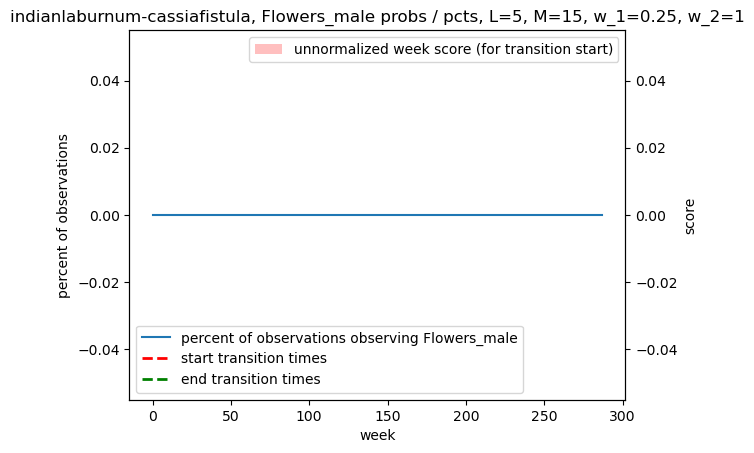

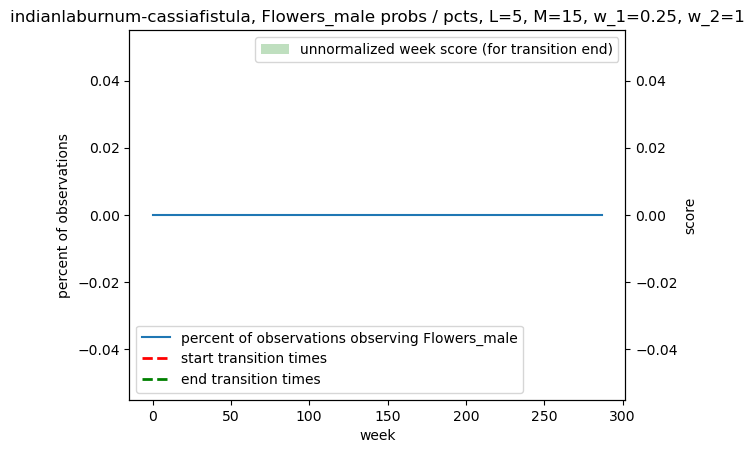

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


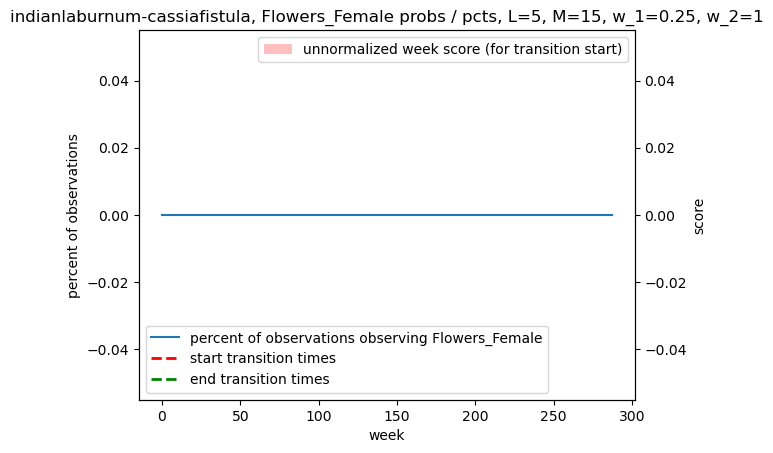

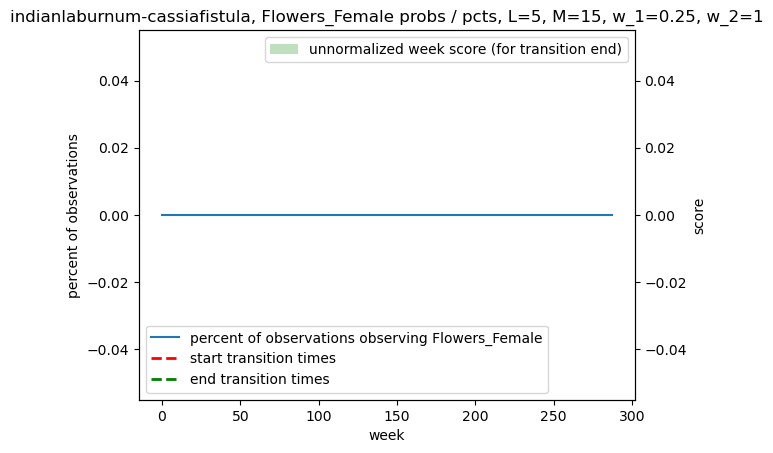

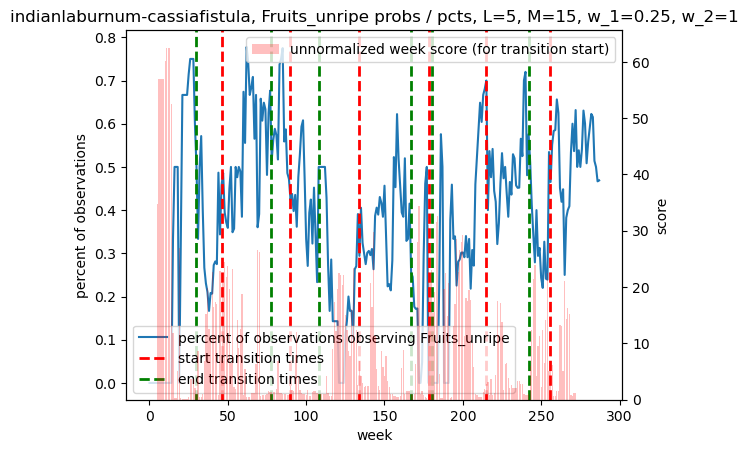

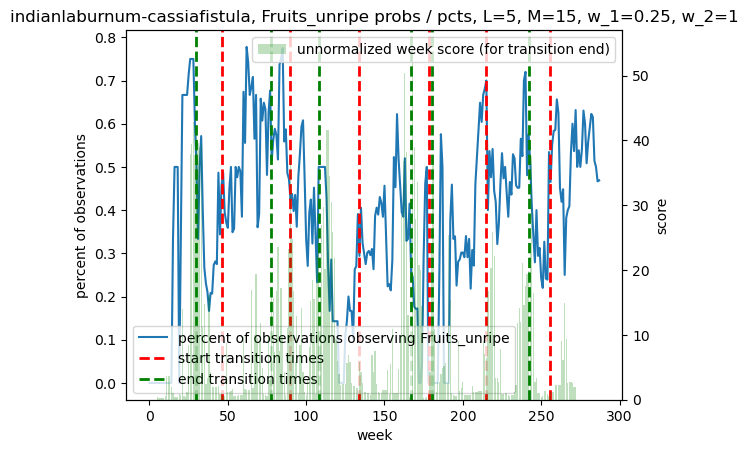

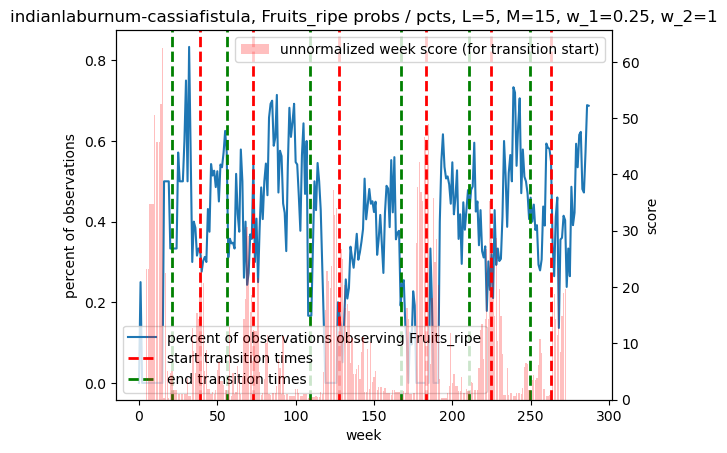

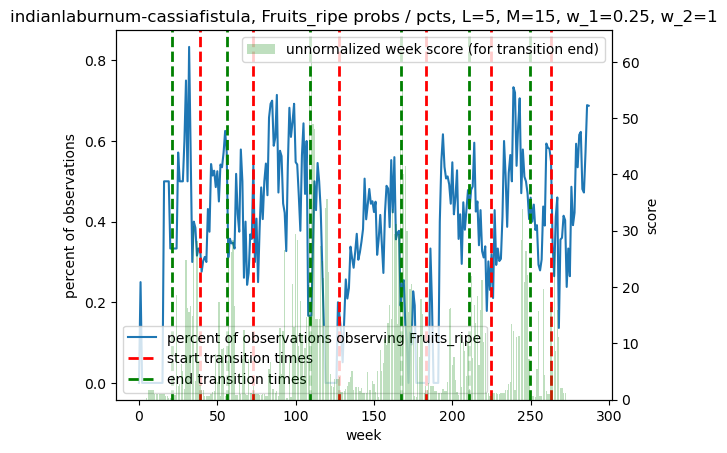

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


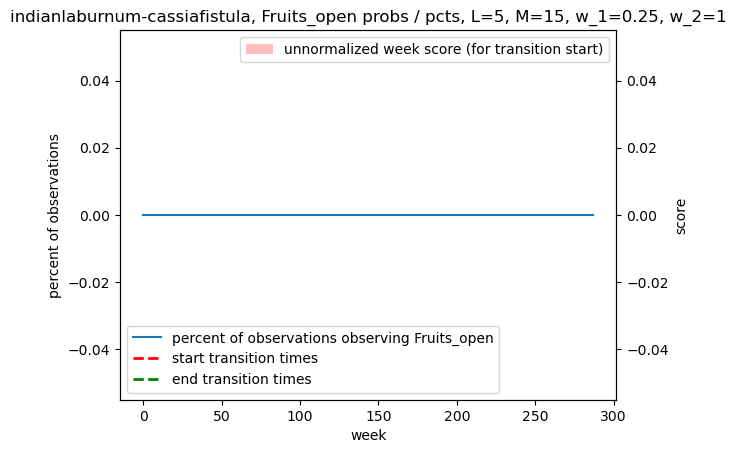

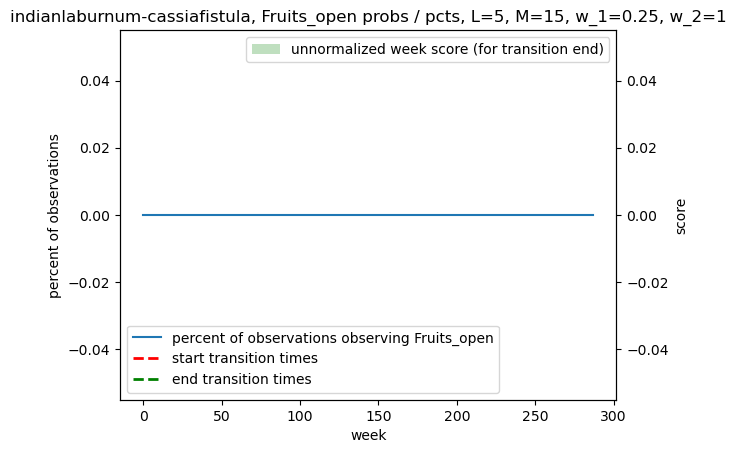

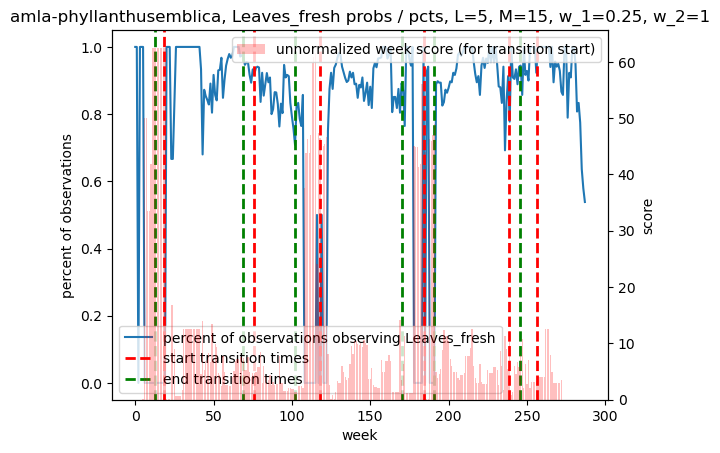

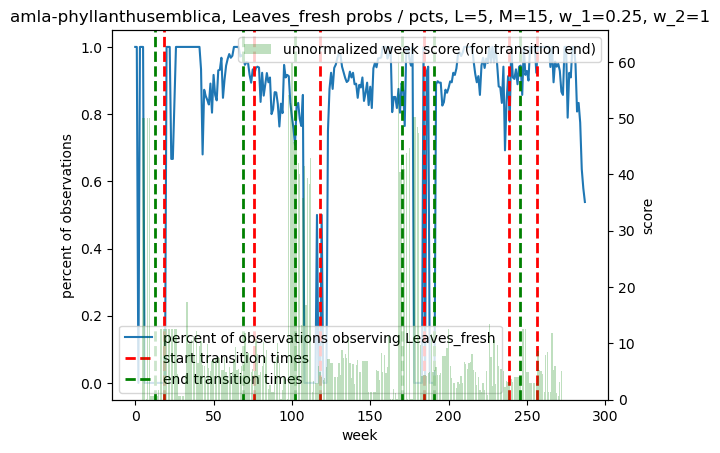

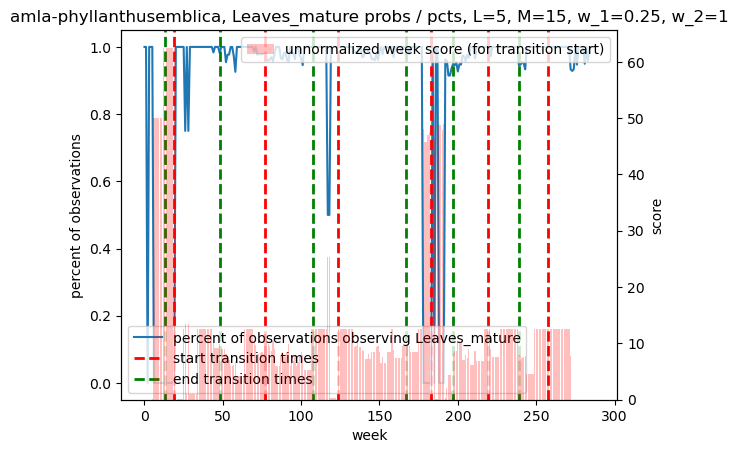

...

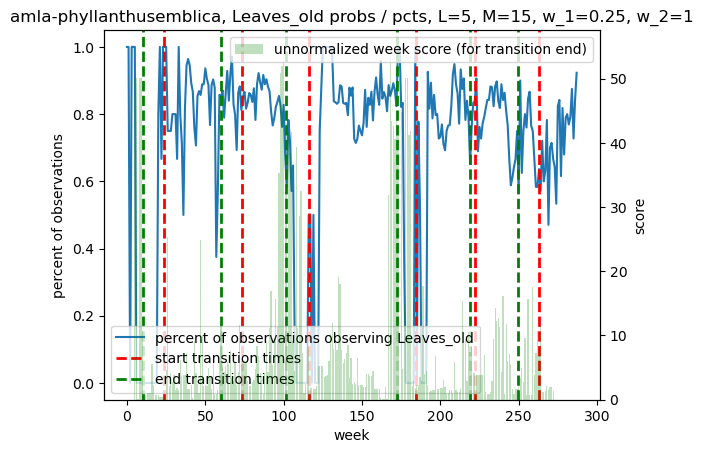

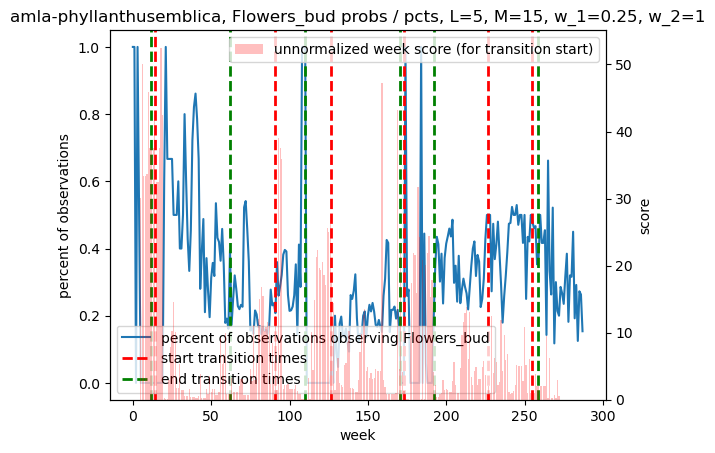

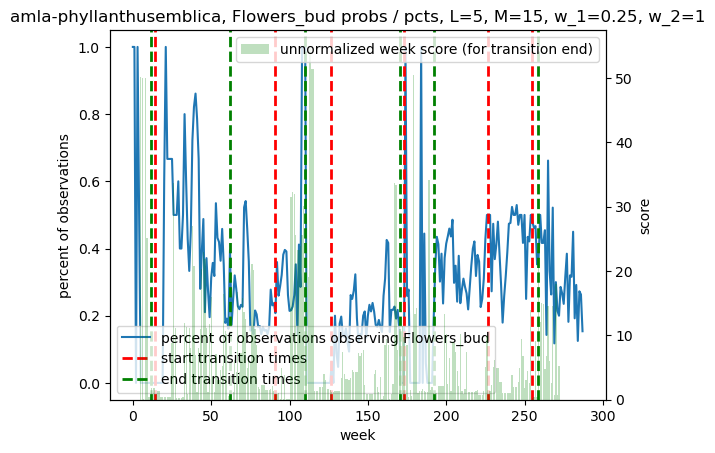

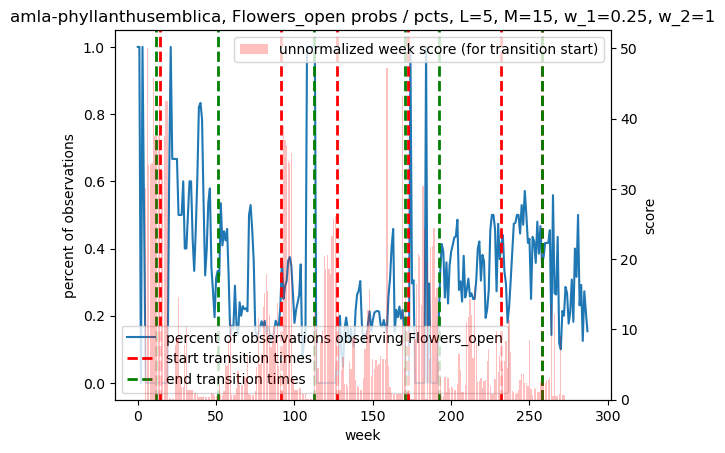

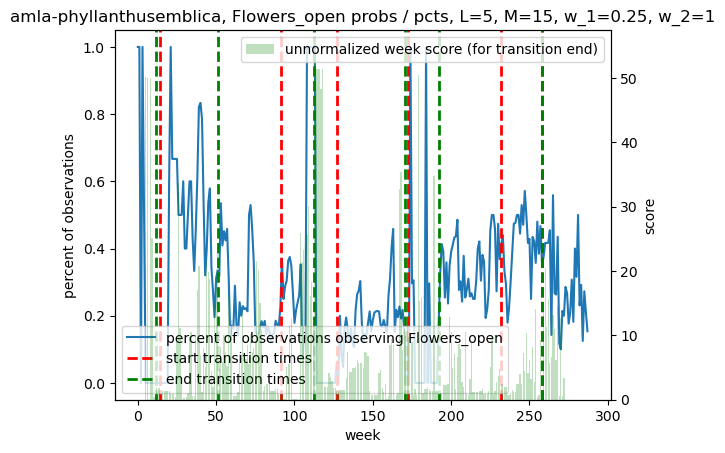

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


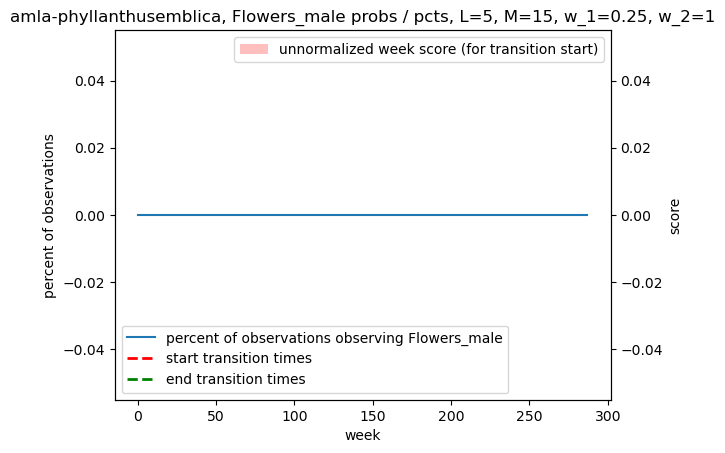

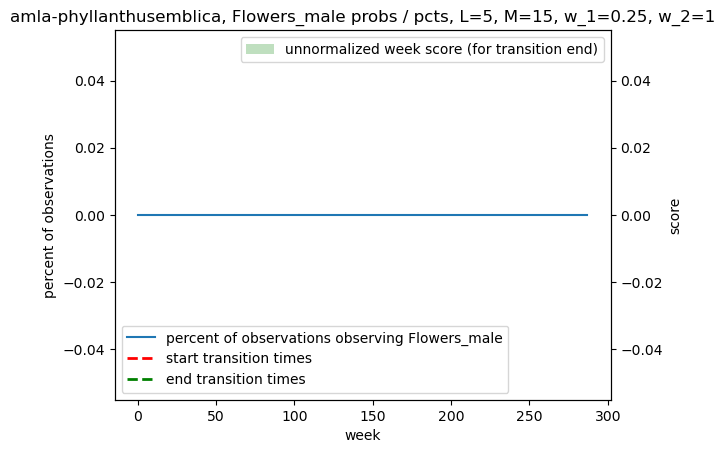

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


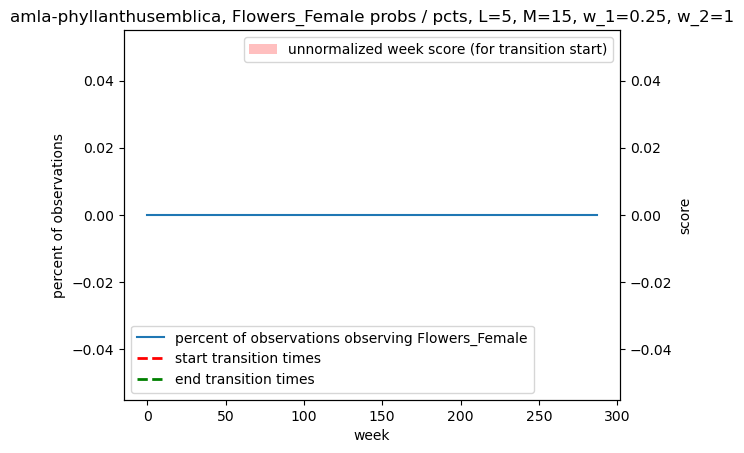

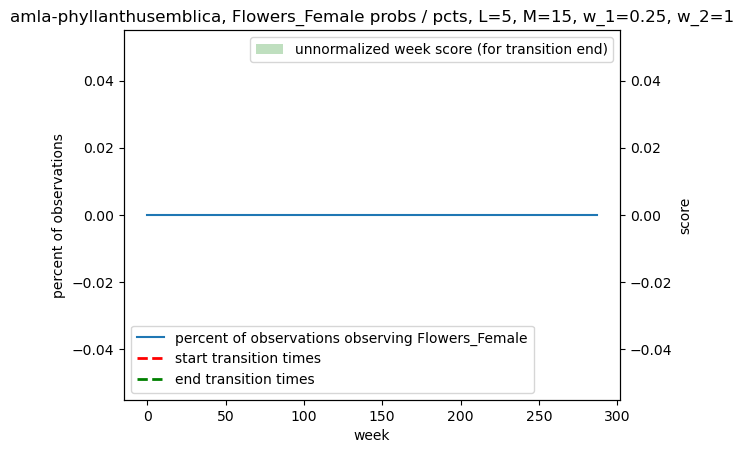

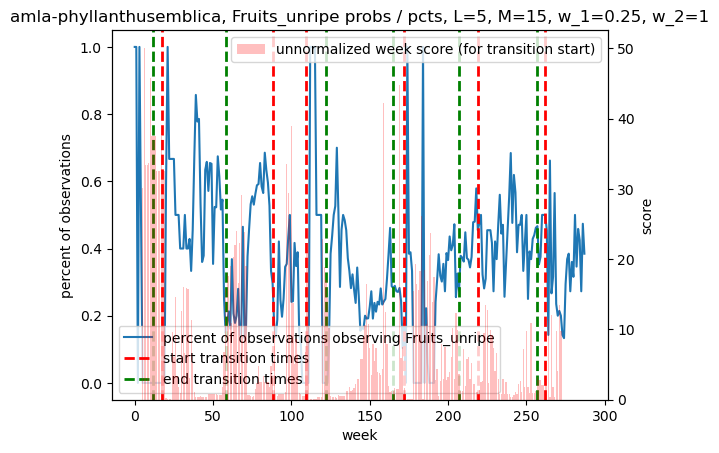

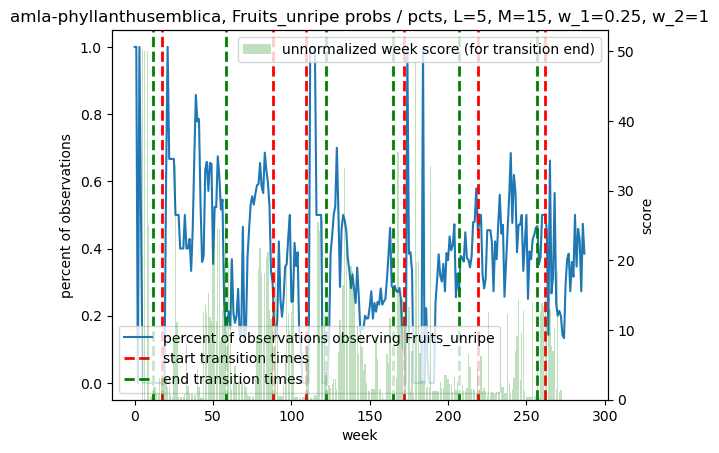

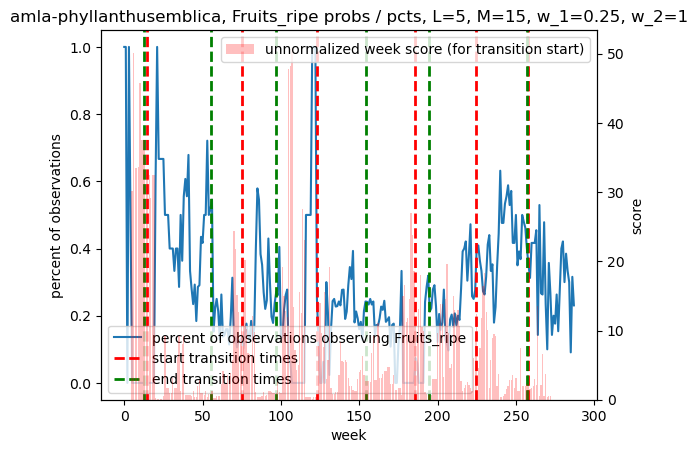

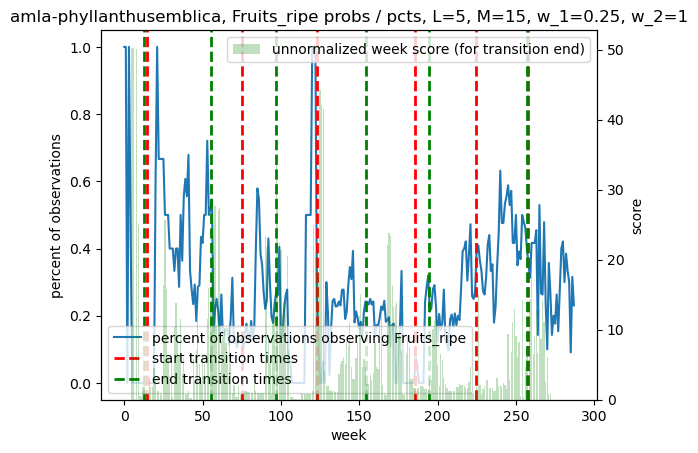

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


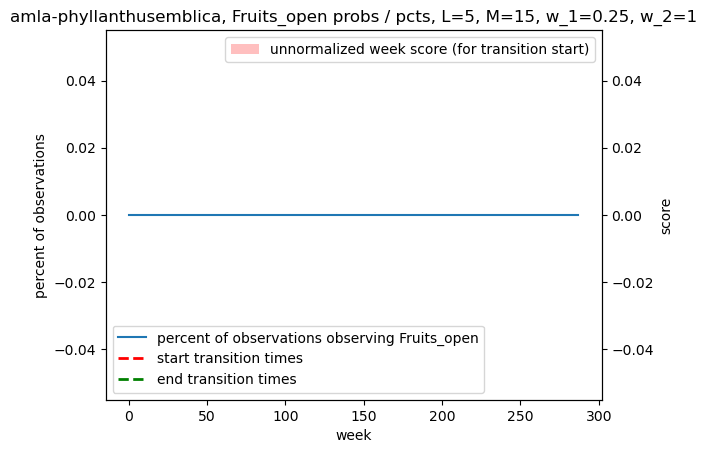

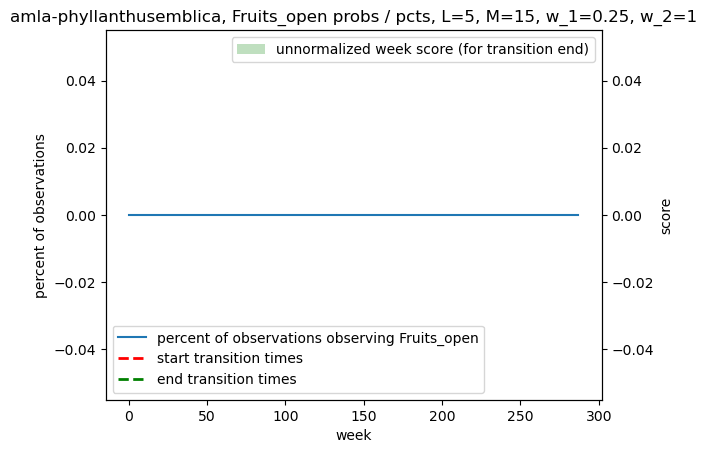

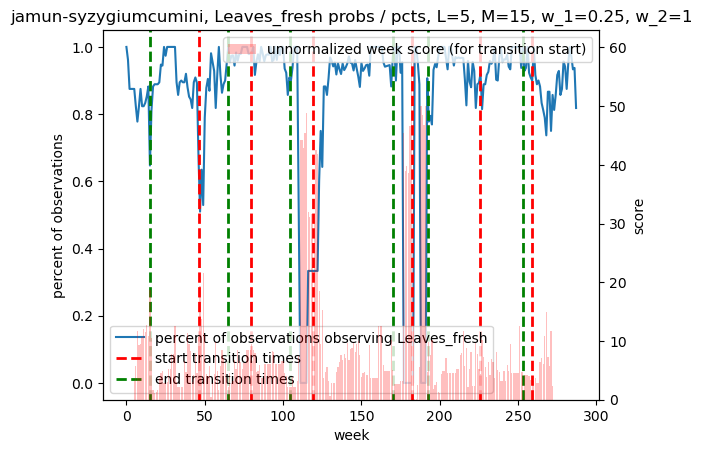

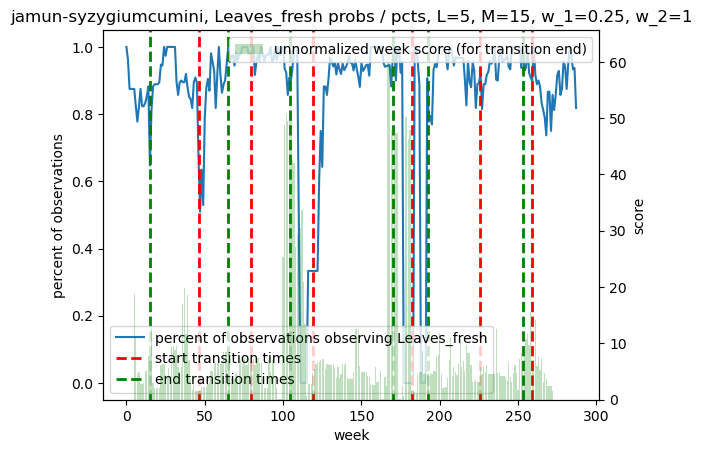

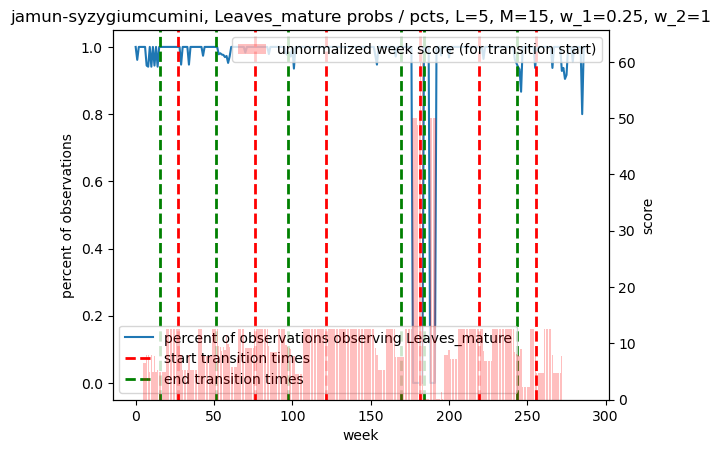

...

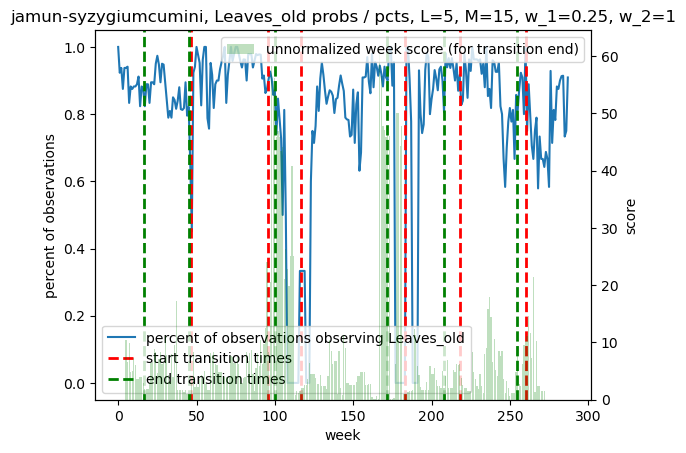

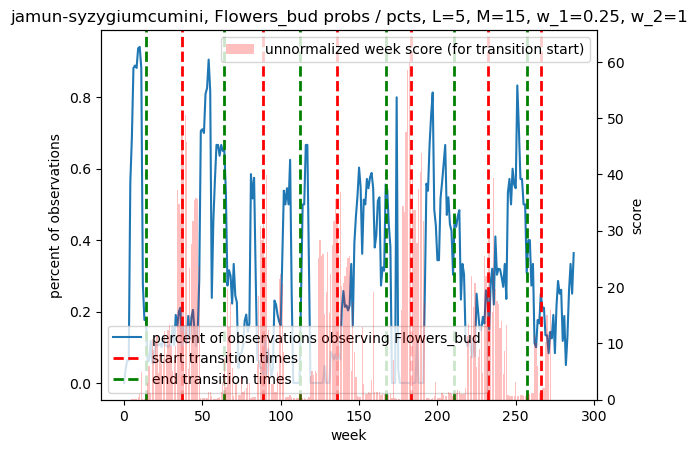

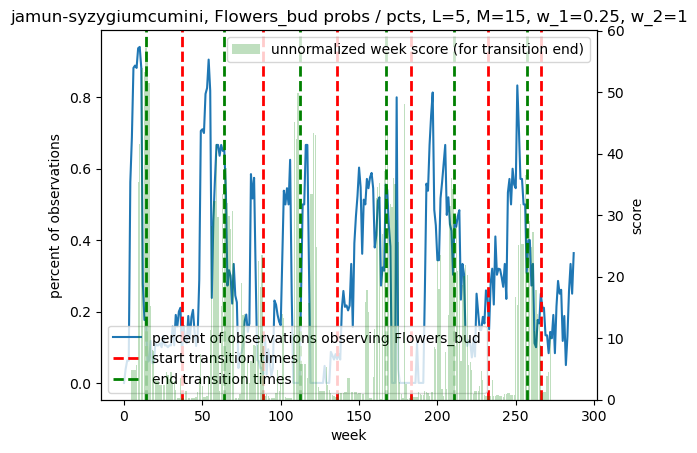

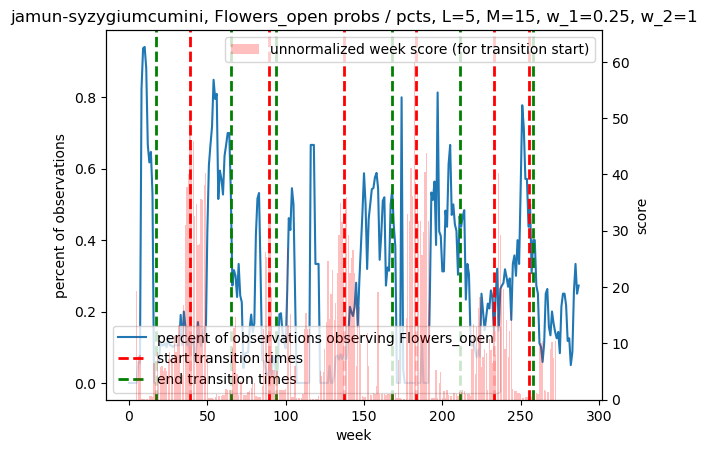

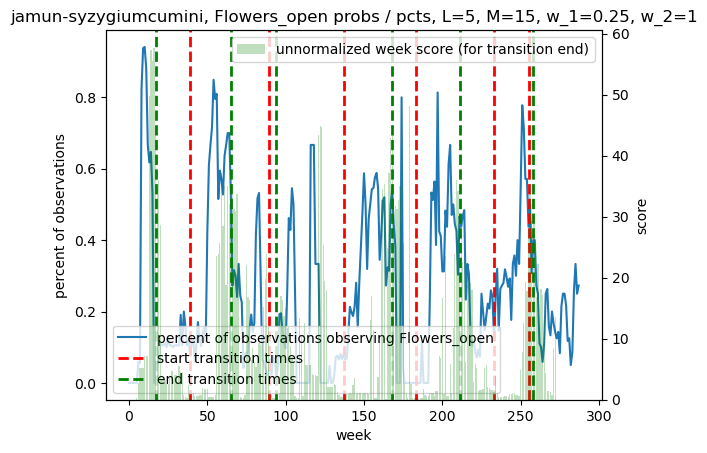

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


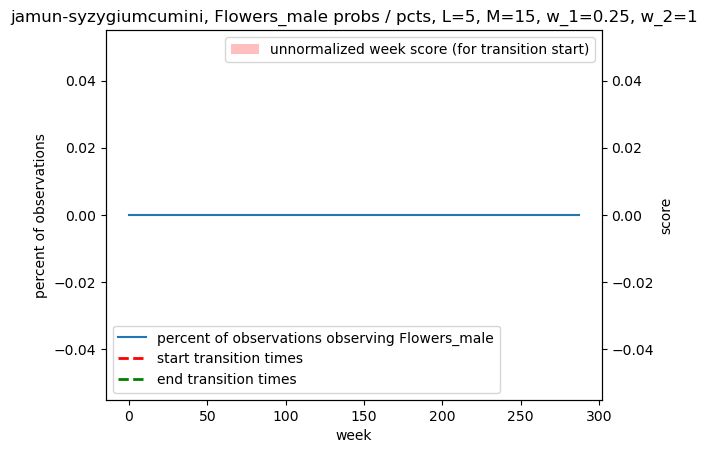

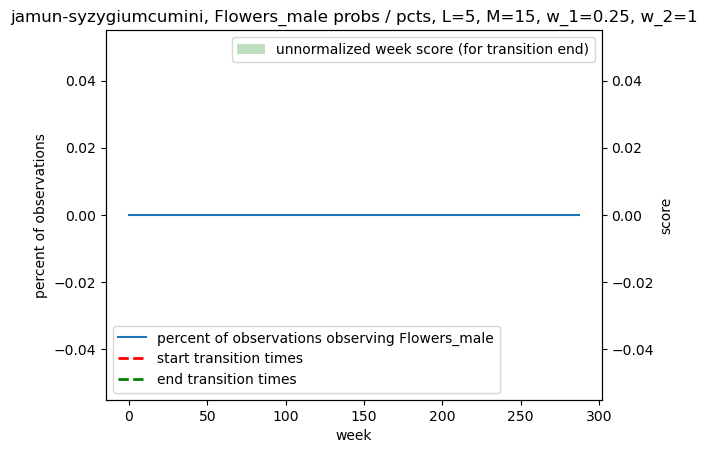

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


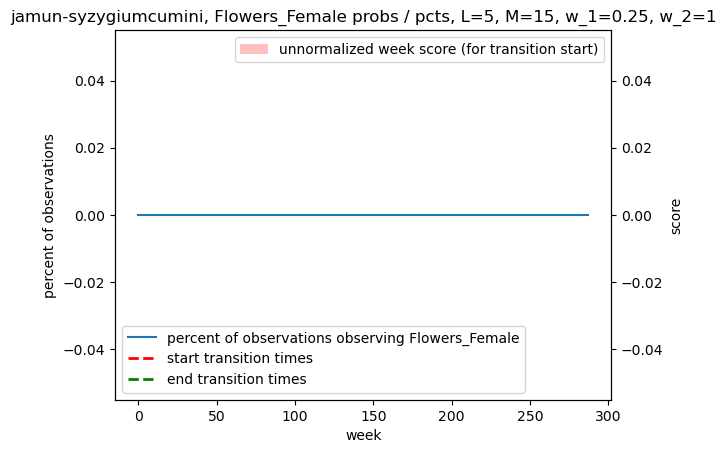

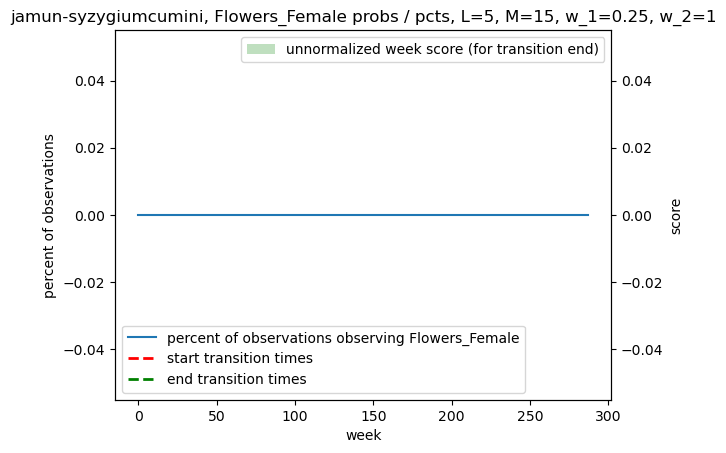

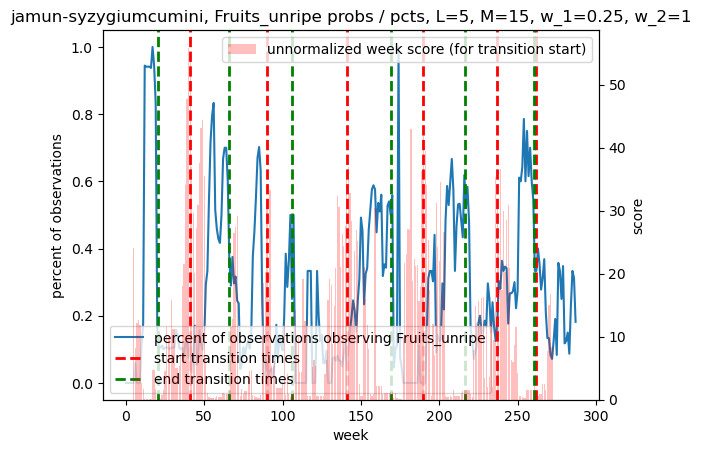

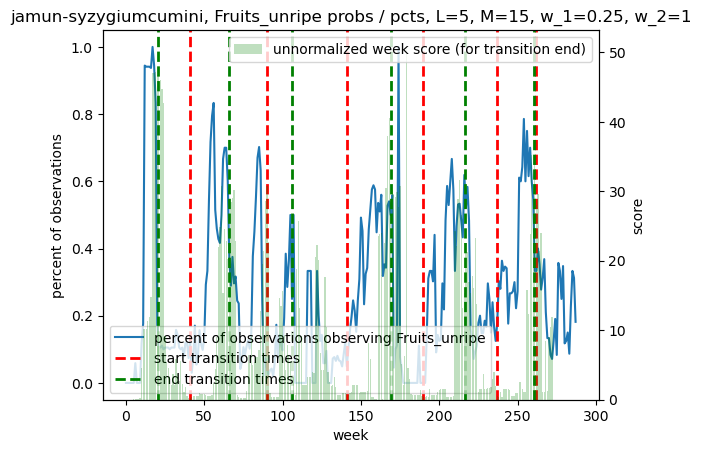

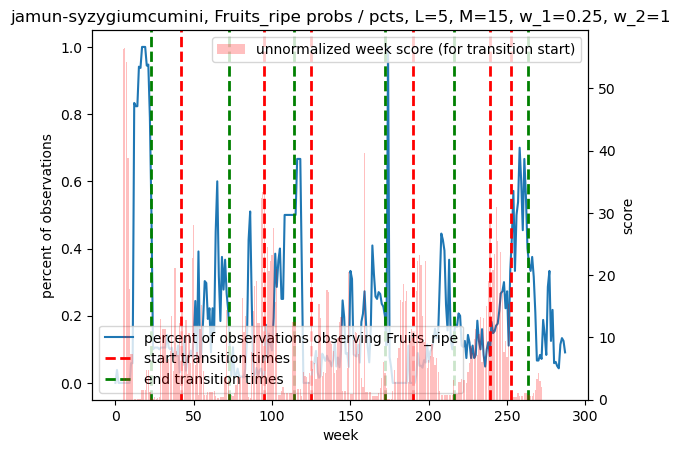

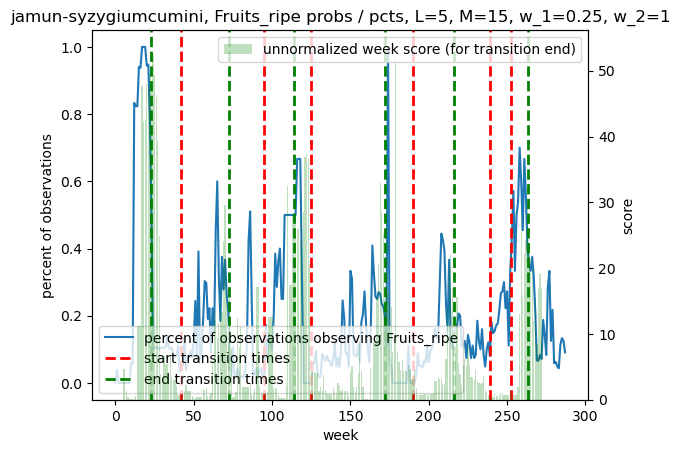

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


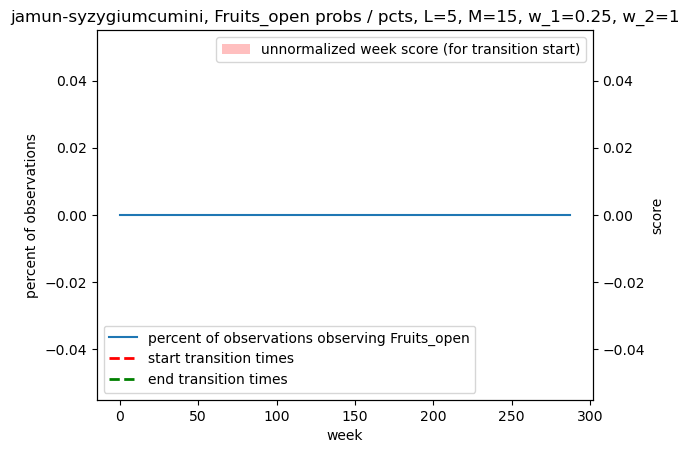

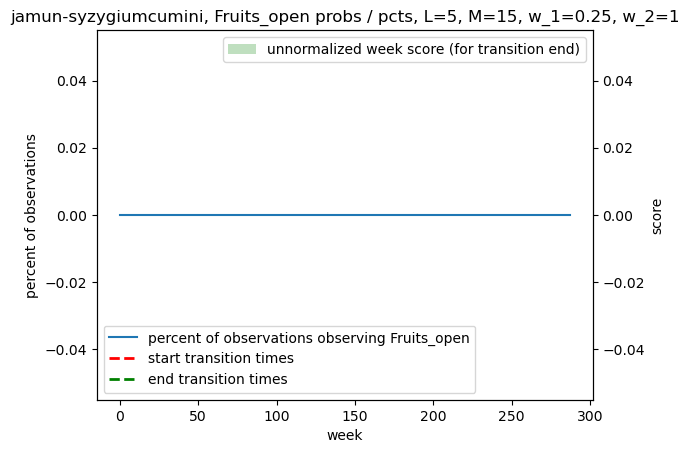

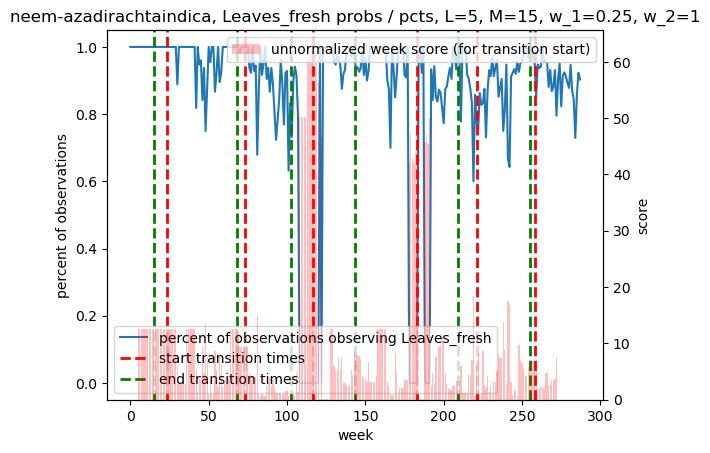

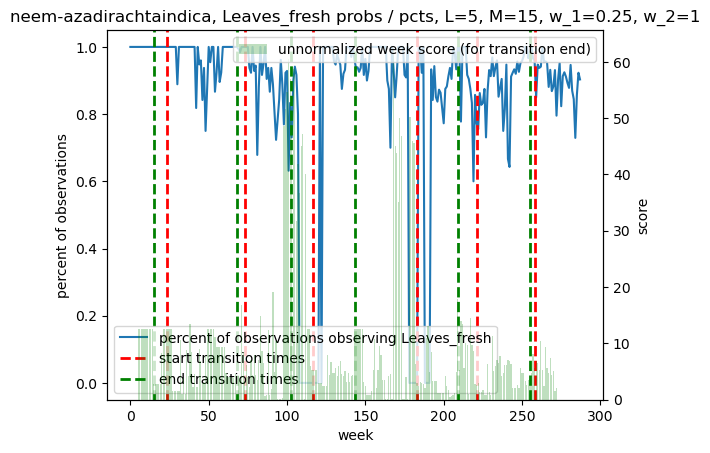

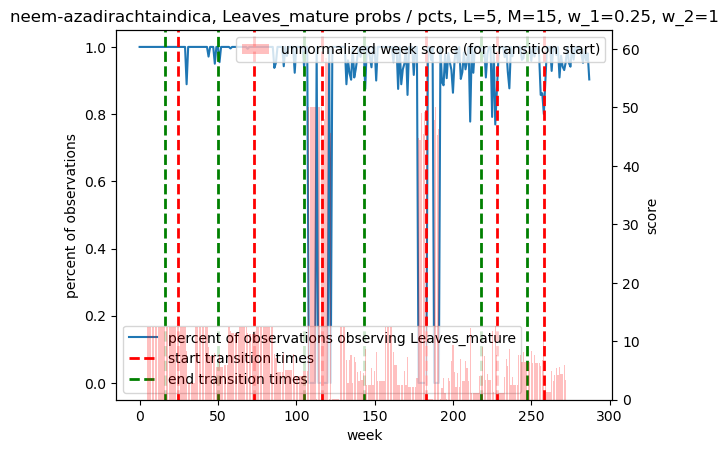

...

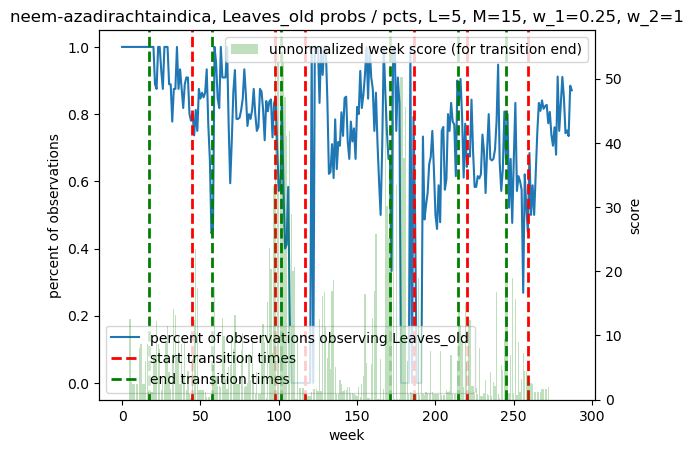

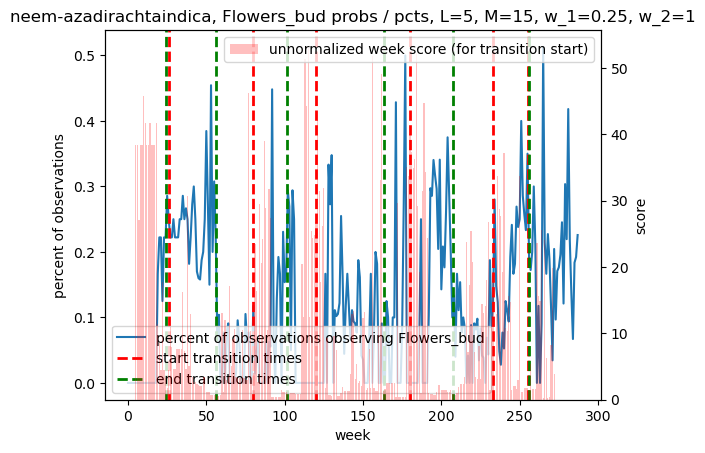

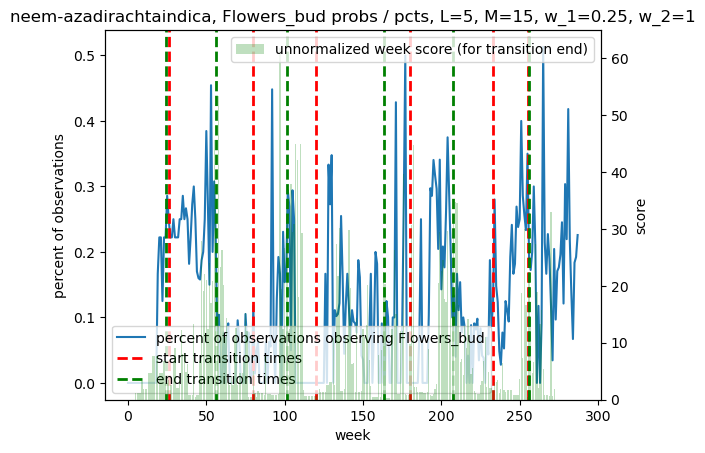

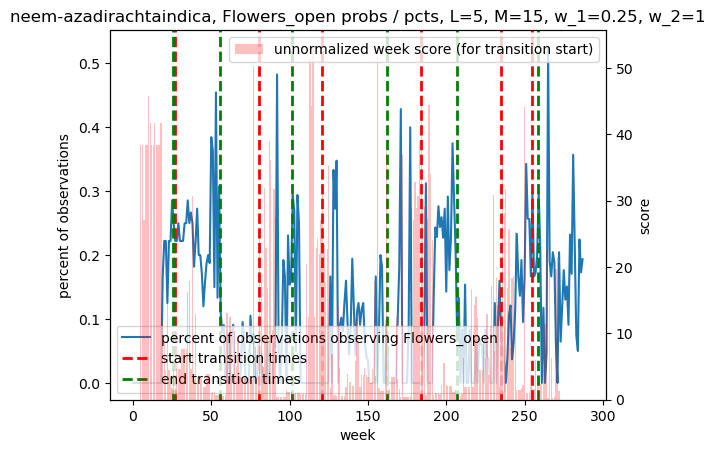

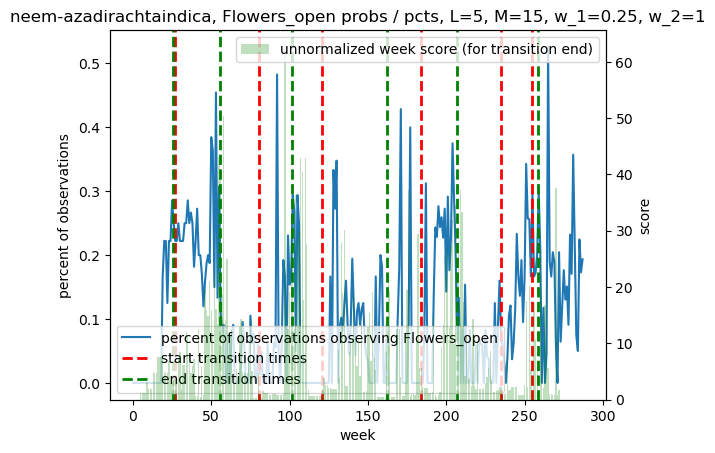

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


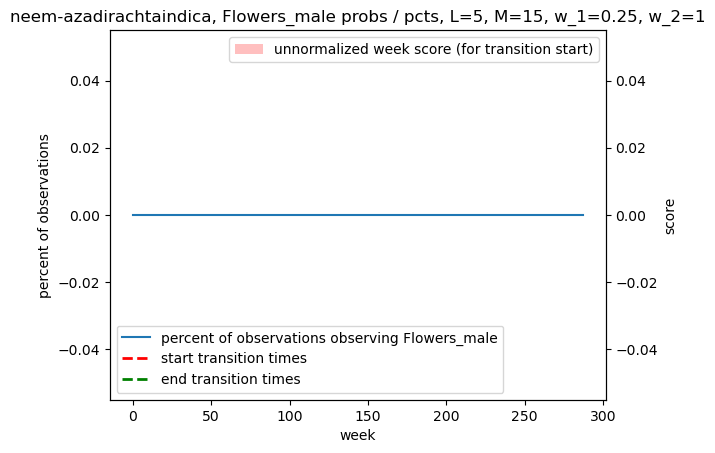

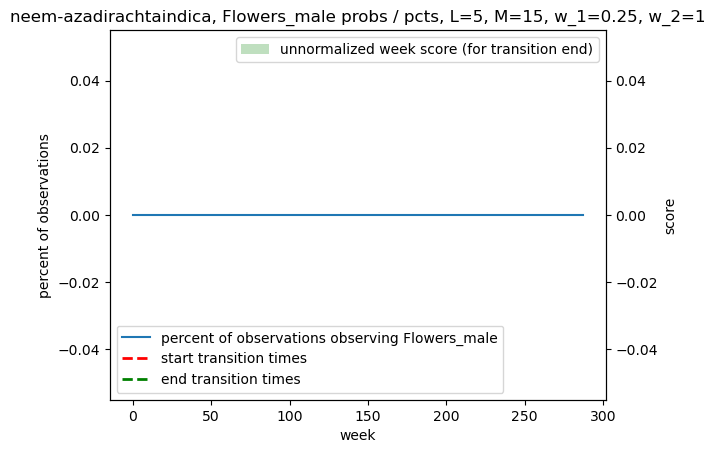

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


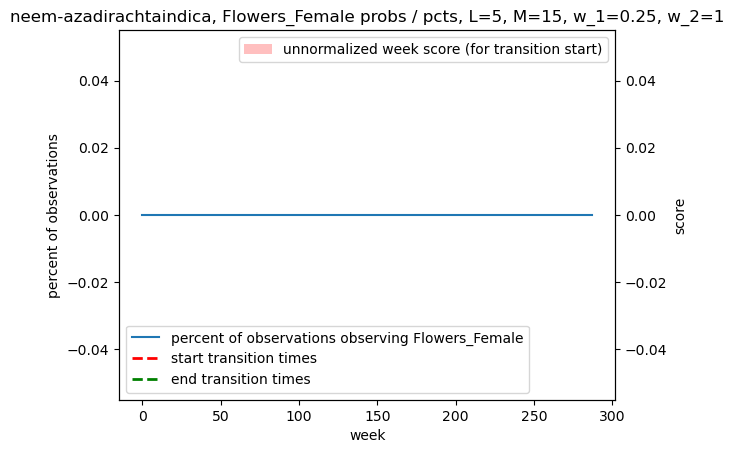

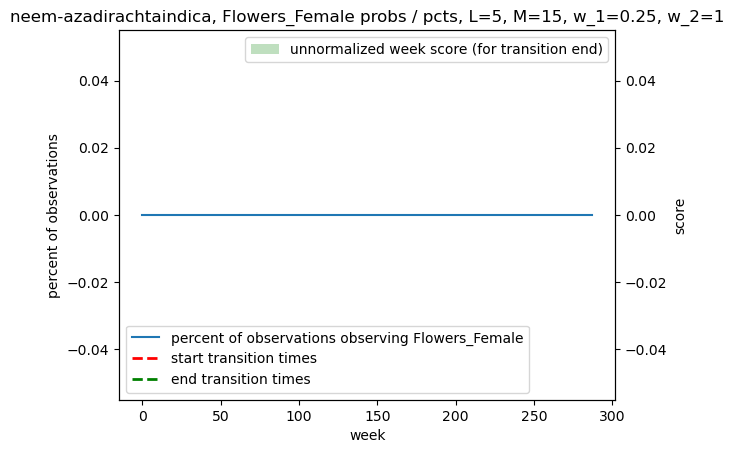

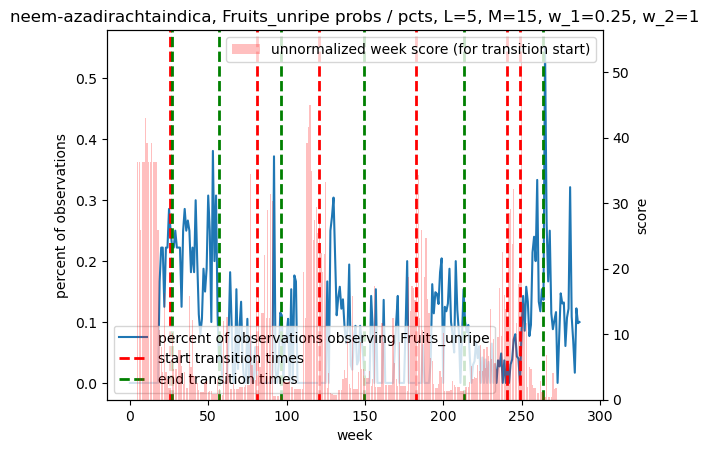

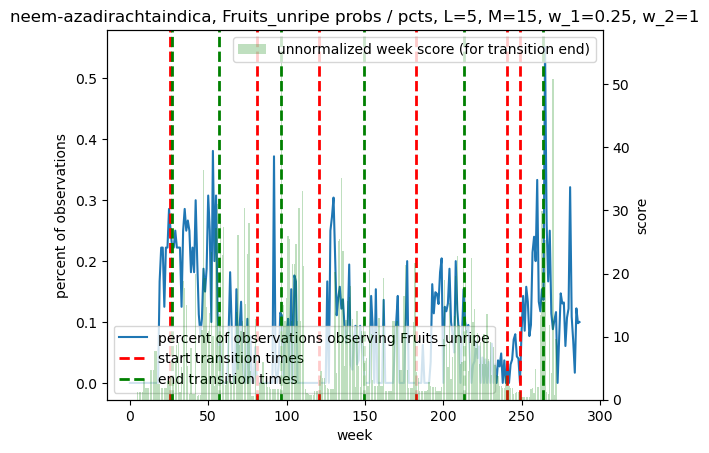

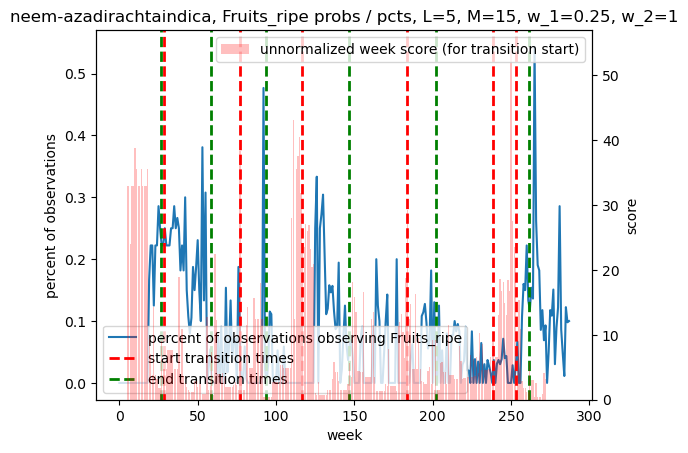

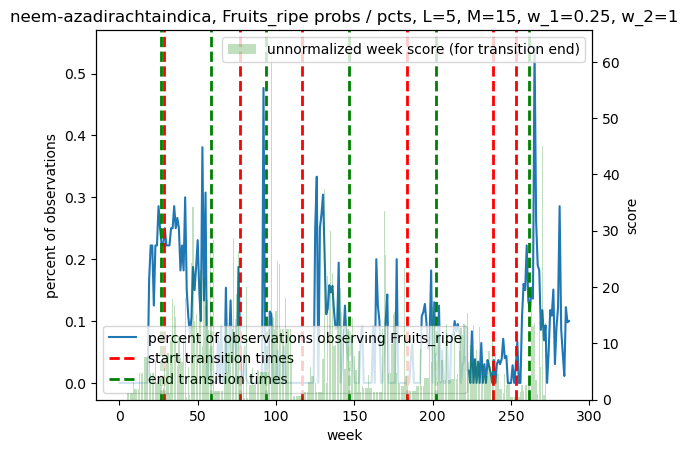

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


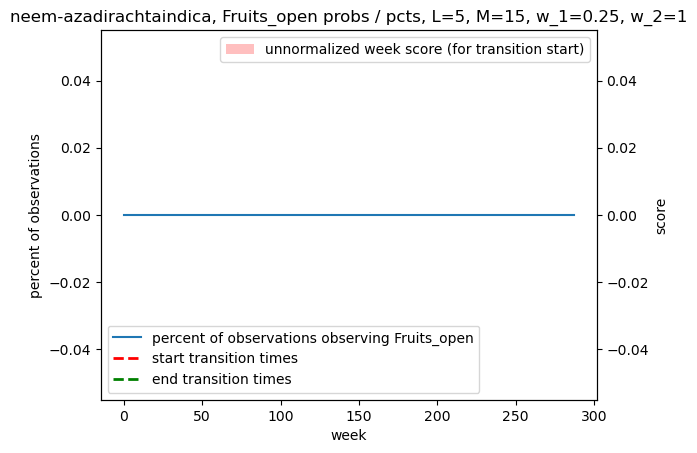

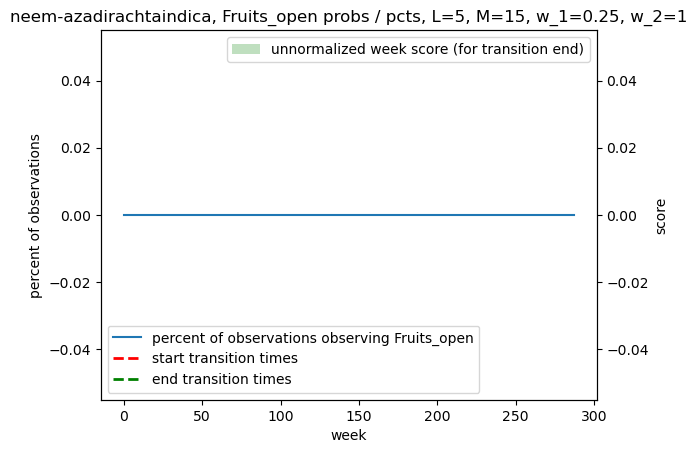

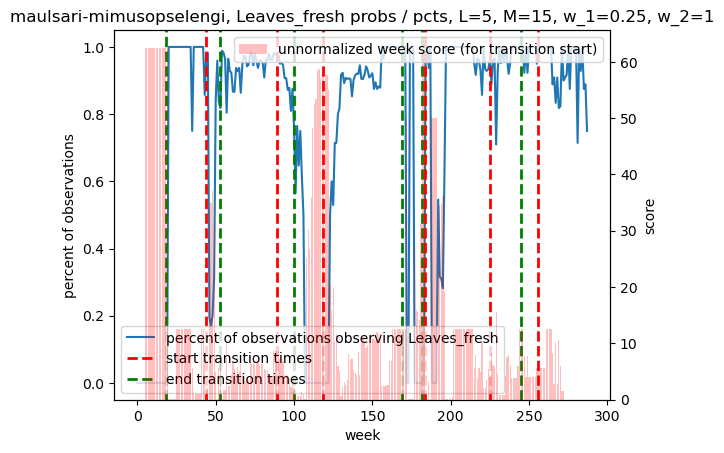

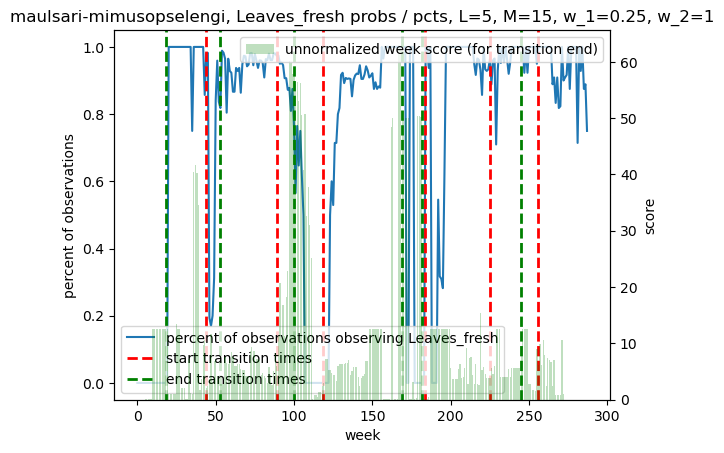

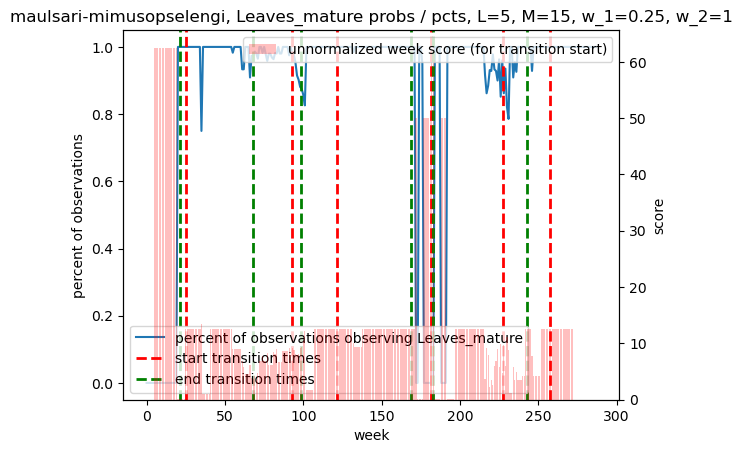

...

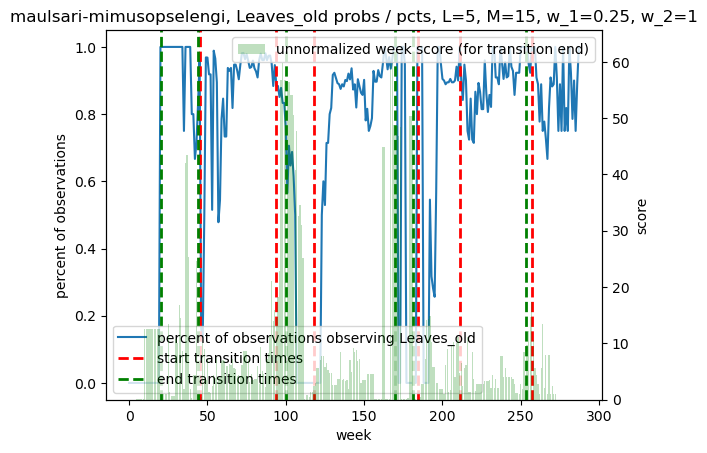

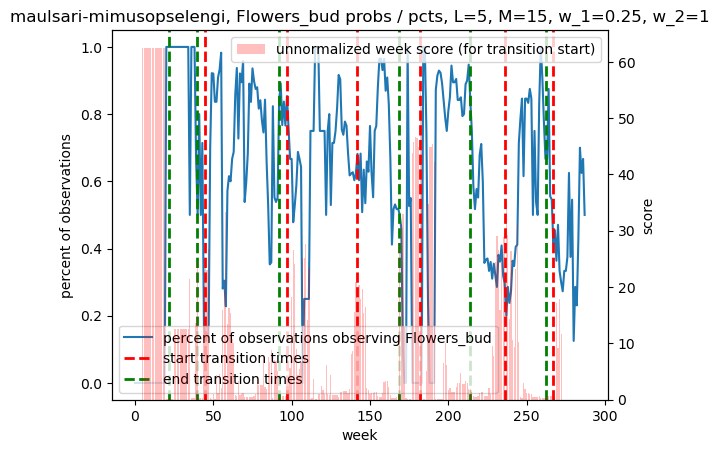

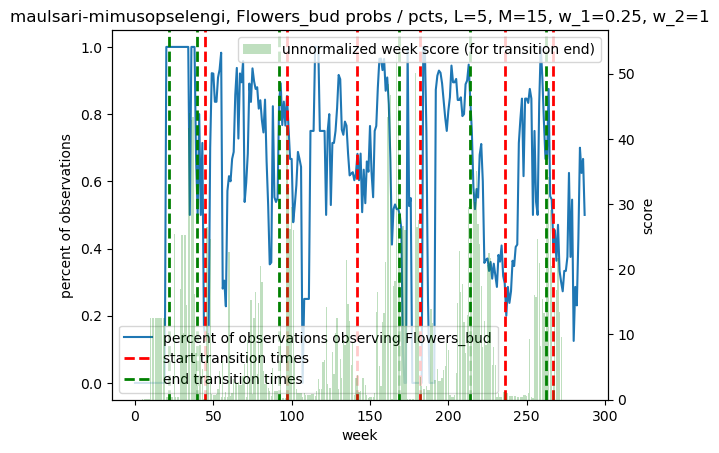

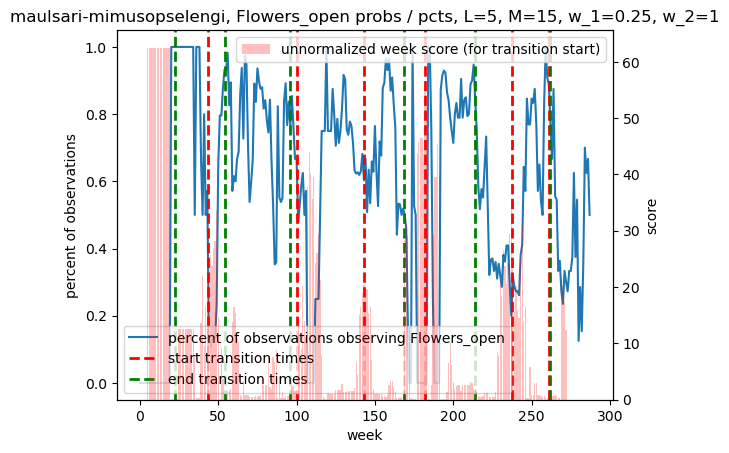

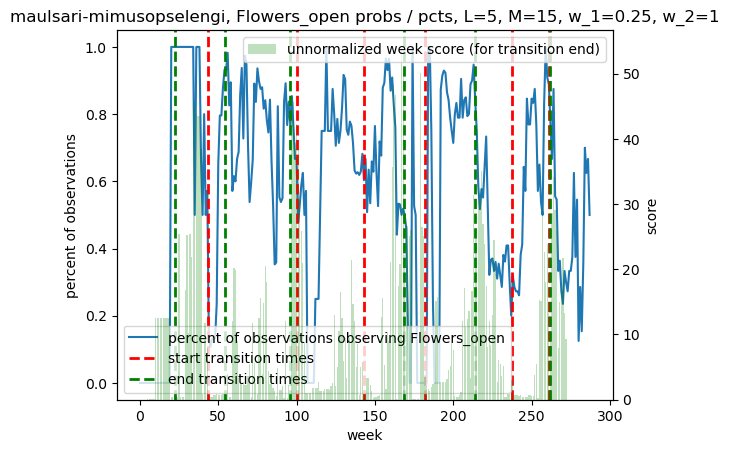

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


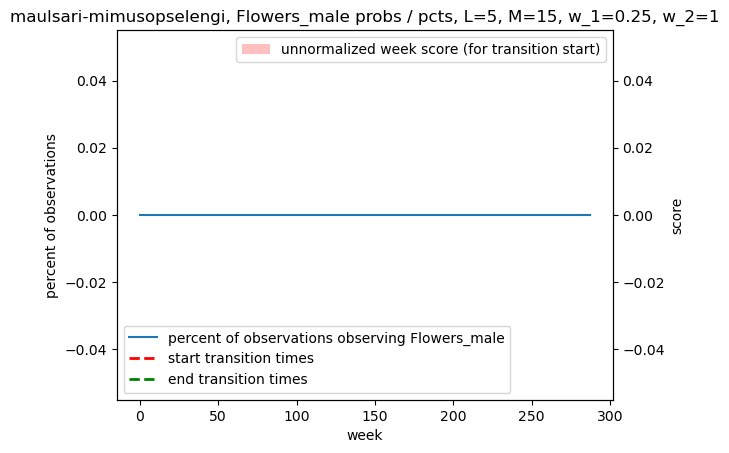

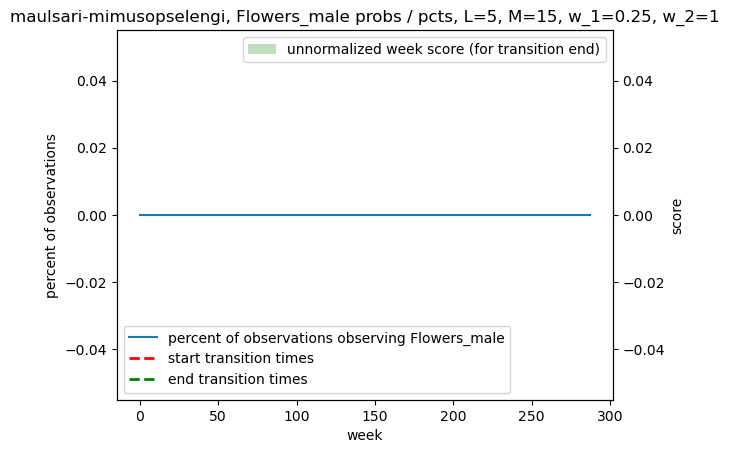

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


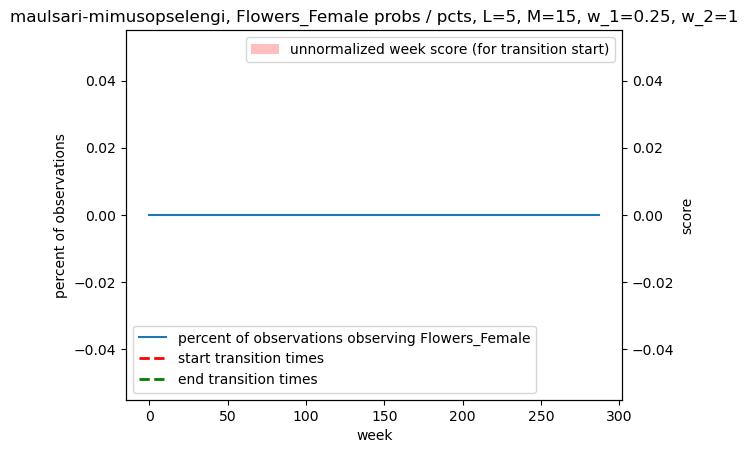

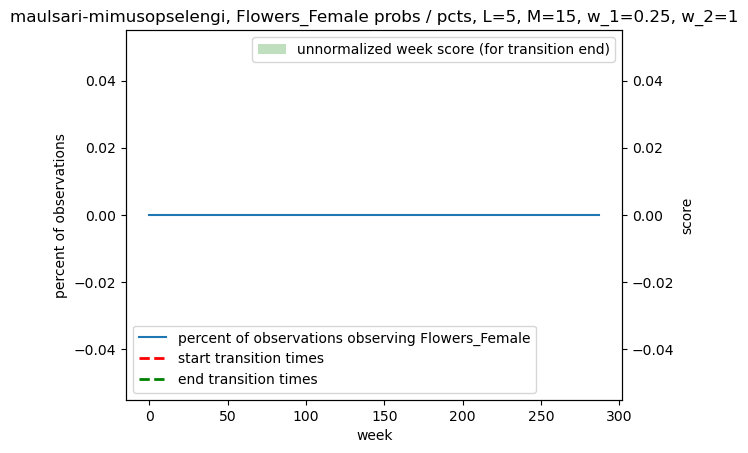

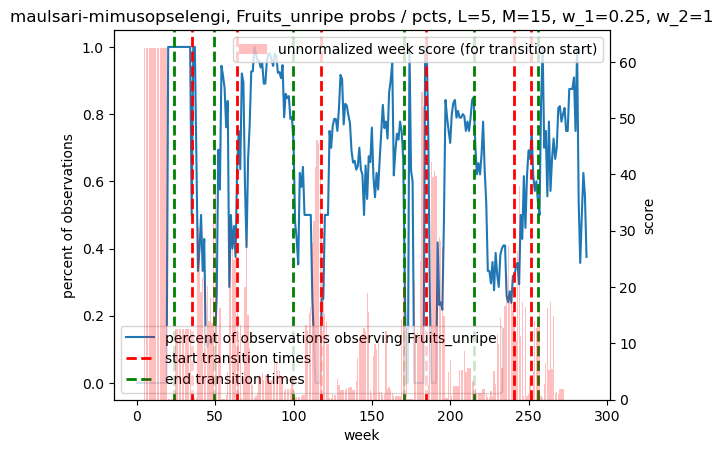

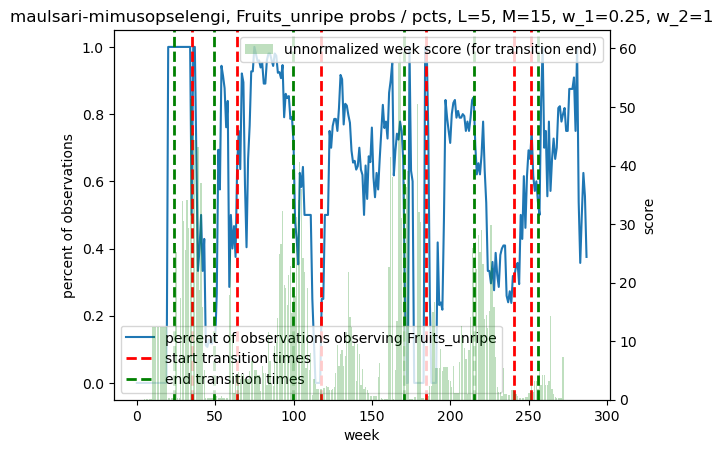

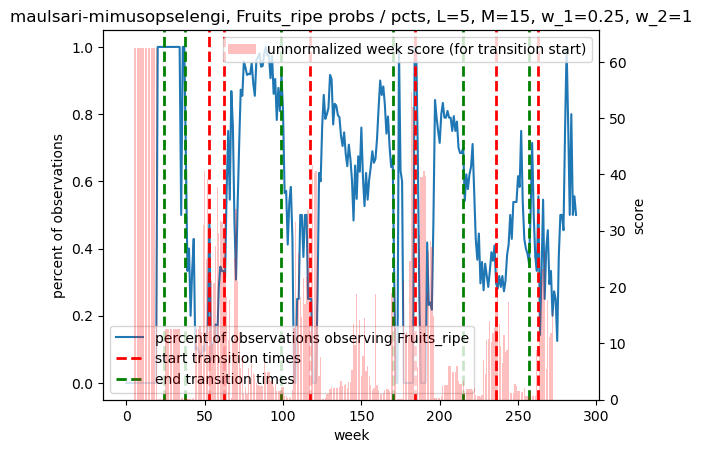

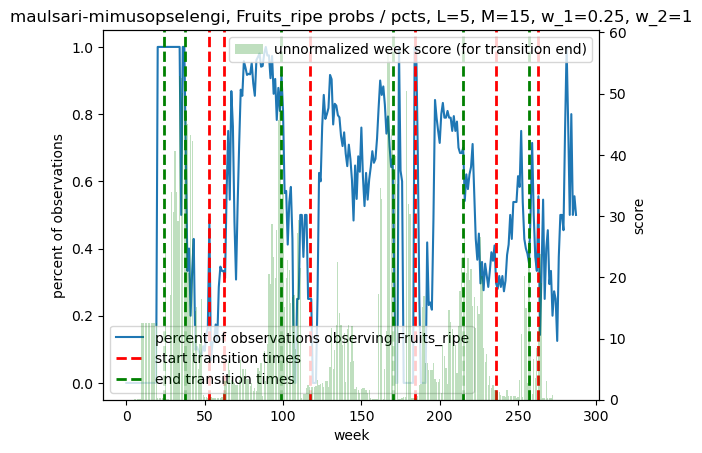

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


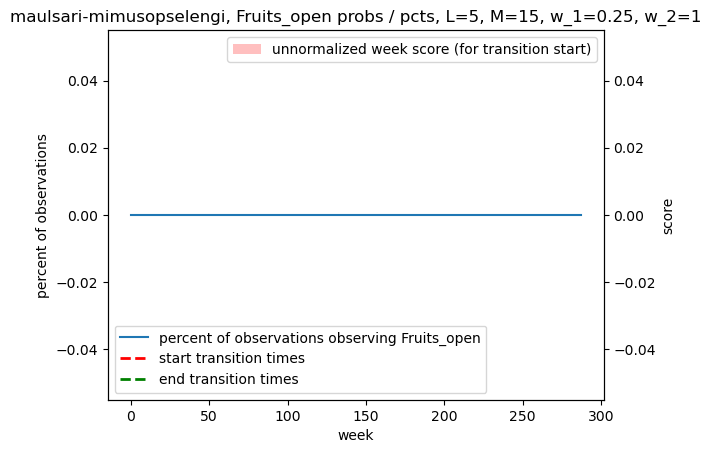

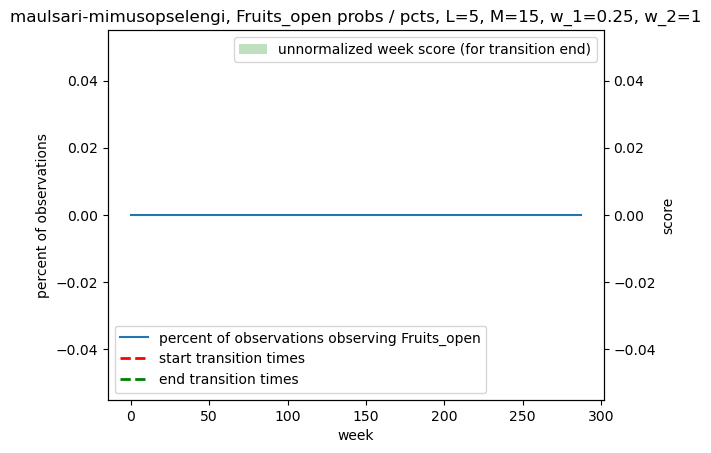

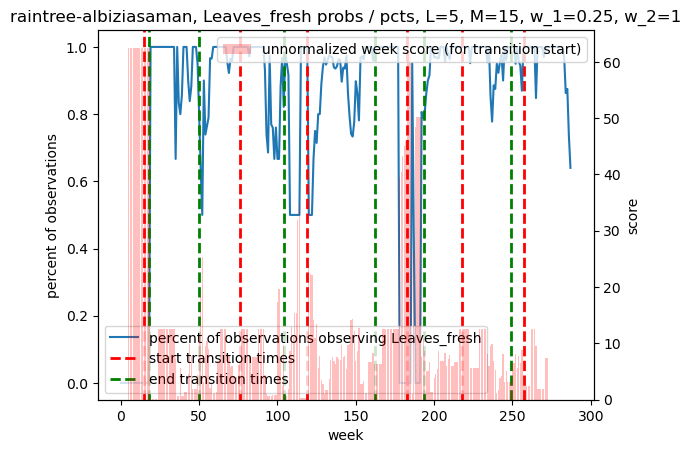

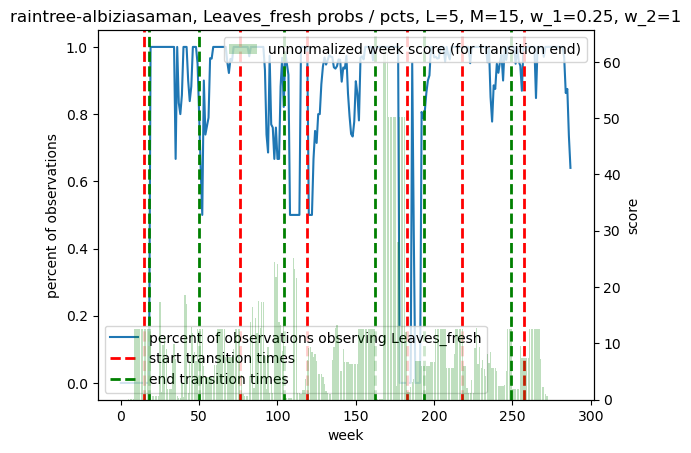

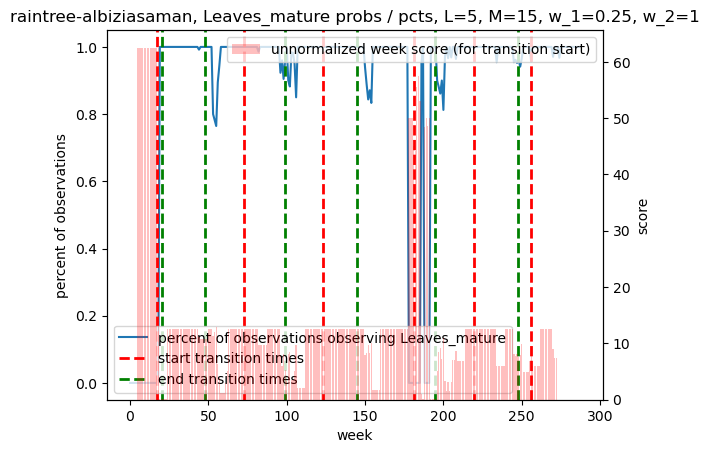

...

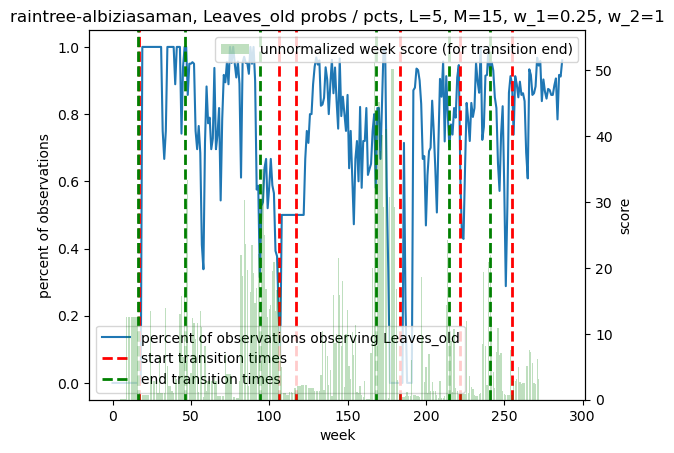

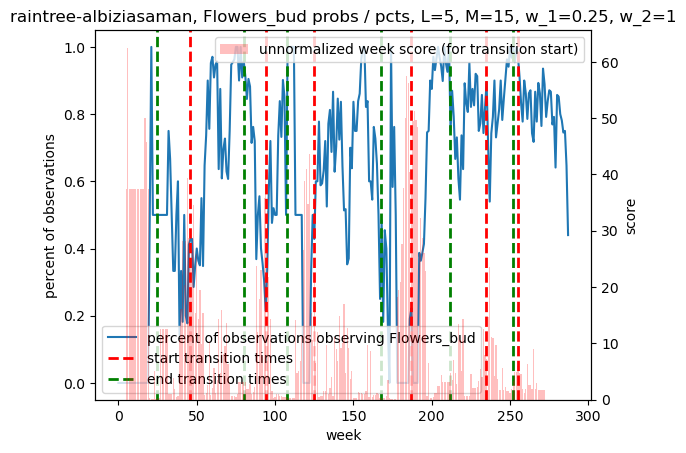

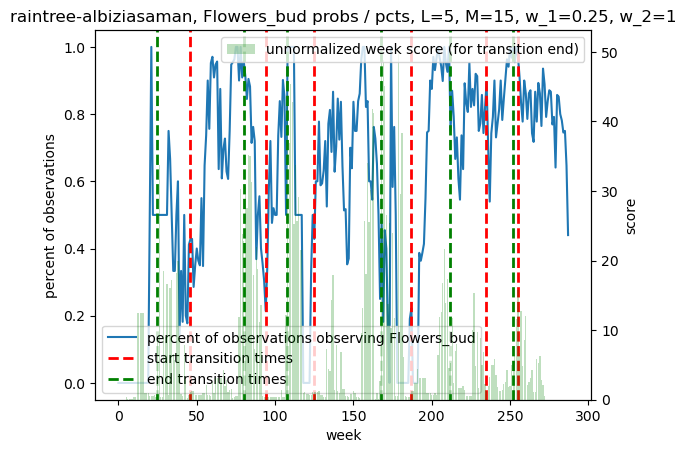

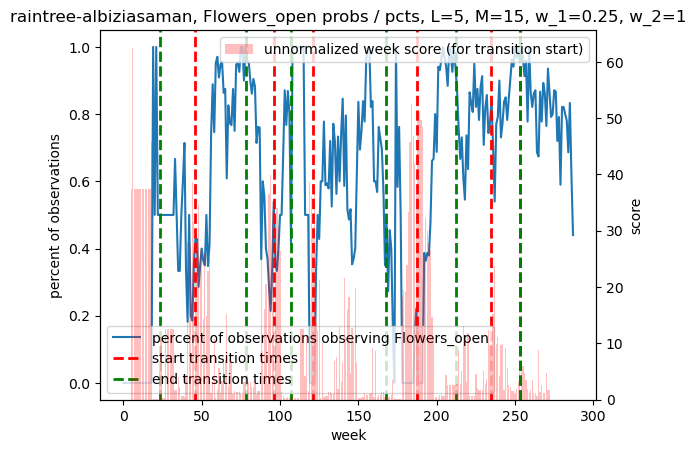

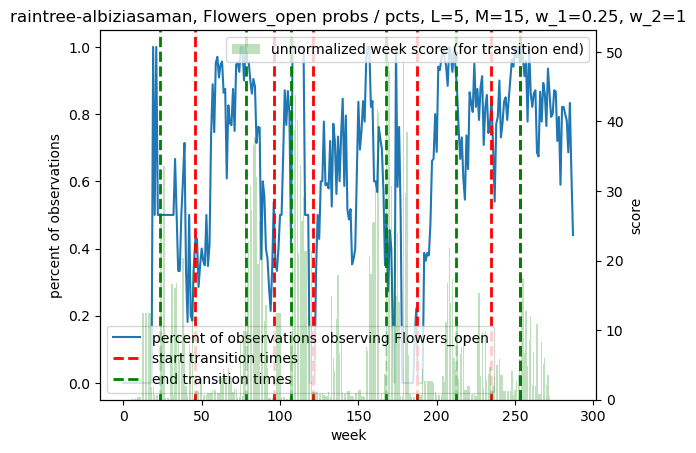

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


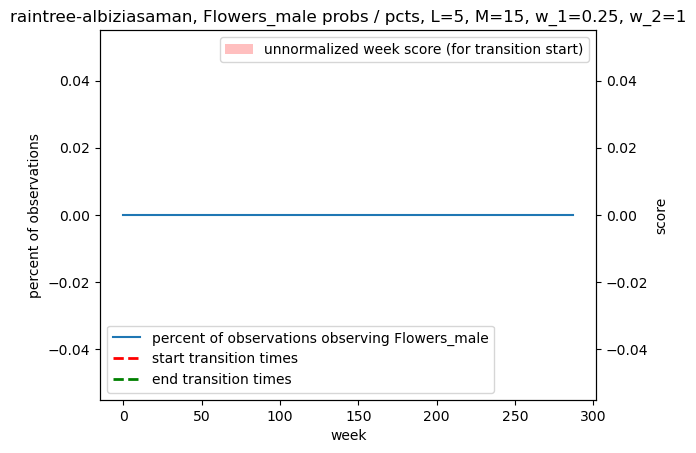

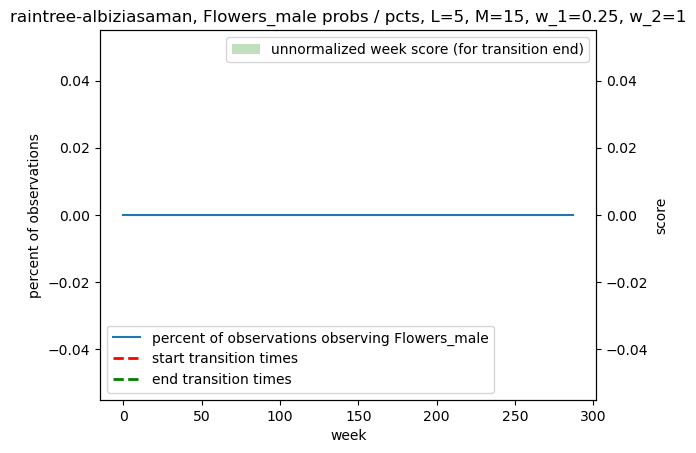

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


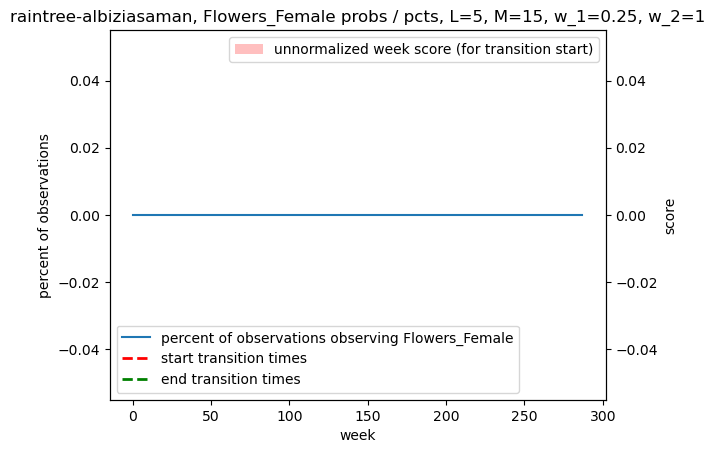

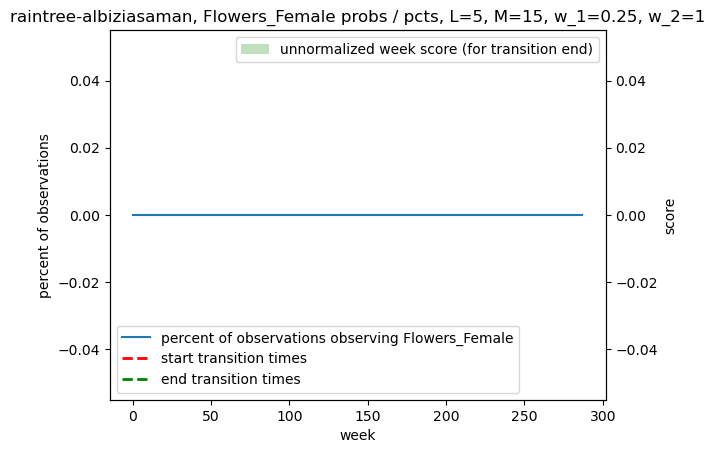

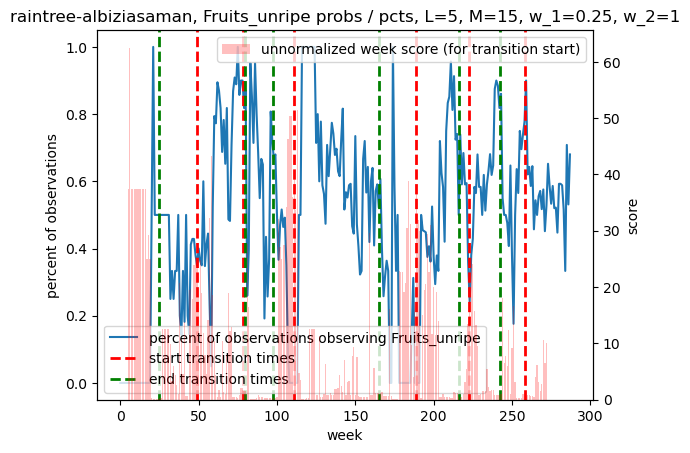

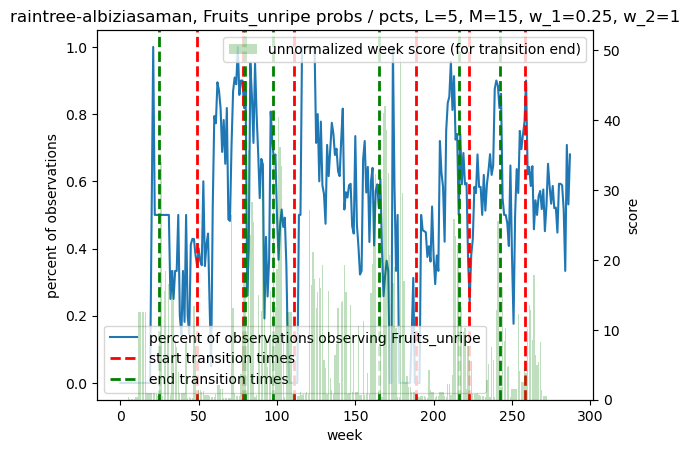

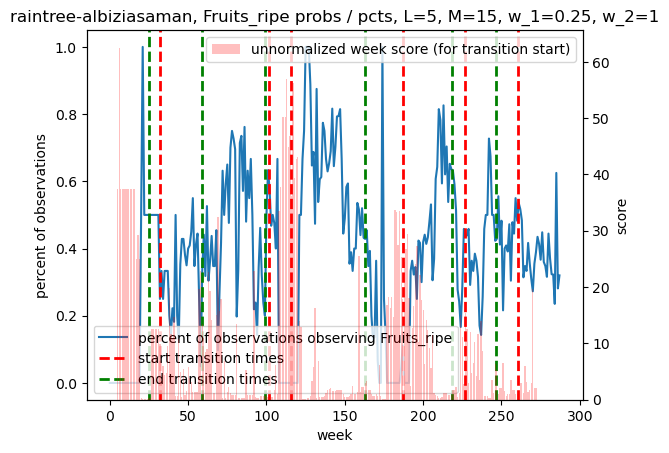

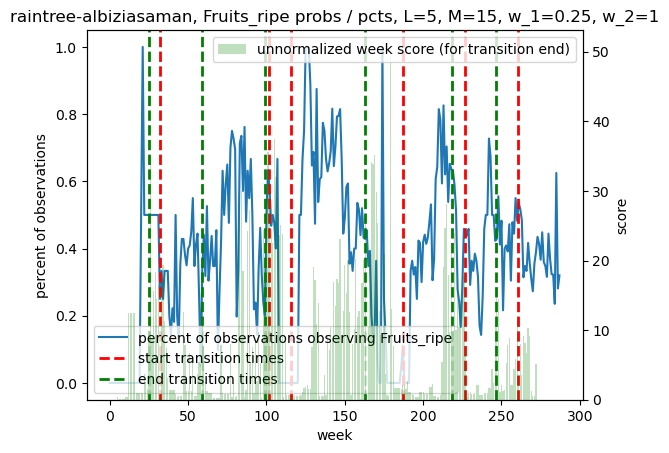

/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:16: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)
/var/folders/cy/ytbbt0v93sx8p6kz3mn8qr9m0000gn/T/ipykernel_16646/3212180332.py:32: RuntimeWarning: invalid value encountered in divide
  spikes = 100 * (np.array(spikes) - np.min(spikes)) / np.max(spikes)


In [ ]:
M = 15
L = 5
w_1 = 0.25
w_2 = 1
kerala_df = pd.read_csv('all data/citizen/kerala.csv')
top_10_ids = kerala_df['Species_id'].value_counts().index.tolist()[:10]
attrs = ['Leaves_fresh', 'Leaves_mature', 'Leaves_old', 'Flowers_bud',
       'Flowers_open', 'Flowers_male', 'Flowers_Female', 'Fruits_unripe',
       'Fruits_ripe', 'Fruits_open']
for species_id in top_10_ids:
    for attr in attrs:
        plot_score_and_pcts(species_id, attr, L=L, M=M, w_1=w_1, w_2=w_2)

In [111]:
def get_means_and_stds(state_df, species_id, attr, L=5, M=3, w_1=1, w_2=1, w_3=1):
    for idx, year in enumerate(range(2018, 2024)):
        pass